# Изпользуемые библиотеки

1. tensorflow - для машинного обучения;
2. os - функции для работы с операционной системой, для работы с файлами;
3. matplotlib - вывод графиков;
4. pillow - работа с изображениями
5. NumPy - работа с матрицами

In [1]:
import tensorflow as tf
import numpy as np
import os
import time

from matplotlib import pyplot as plt
from IPython import display

from tensorflow.keras.models import  Model
from tensorflow.keras.layers import (Input, Dense,  Flatten, BatchNormalization,  Conv2D,  Dropout, MaxPooling2D, UpSampling2D,Activation, Lambda, Softmax)
from tensorflow.keras.optimizers import Adam, SGD, Adadelta
from tensorflow.keras.preprocessing.image import  ImageDataGenerator
from tensorflow.keras.layers import LeakyReLU, concatenate
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, EarlyStopping
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.utils import Sequence

import matplotlib.pyplot as plt
import matplotlib.image as mpimg  
import random
from keras.utils import to_categorical
from PIL import Image
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec





Using TensorFlow backend.


# Глобальные параметры

In [ ]:
# путь к набору данных
PATH_DATASET = r'/kaggle/input/cityscape-x025/dataset025'
BATCH_SIZE = 8
TARGET_SIZE = (256,512)
SEED = 42
TRAIN_SAMPLE = 2975 
VAL_SAMPLE = 500
CLASS_NUMBER = 34
PATH = ''
OUTPUT_CHANNELS = 1
LAMBDA = 100
EPOCHS = 10
BUFFER_SIZE = 2975
IMG_WIDTH = 512
IMG_HEIGHT = 256
MAX_Y = 33

# Класс генератора данных
Используется для постепенной загрузки данных с последующей нормализацией и сегментацией.

Нормализация изображений при помощи формулы:
$$x_{norm} = \frac{X}{127.5} -1 $$

Нормализация масок при помощи формулы:
$$y_{norm} = \frac{y}{33} $$

где 127.5 - половина максимального значения яркости пикселя, 33 - максимальное значение метки классов.

Также производится аугментация данных путём зеркального отражения изображения по вертикали.


In [3]:
class DataGenerator(Sequence):
    def __init__(self, n, x_list_of_files,y_list_of_files ):
        # конструктор класса
        self.n = n
        self.x_files = x_list_of_files
        self.y_files = y_list_of_files
        self.indexes = np.arange(self.n)
        self.batch_size = BATCH_SIZE//2

    def __len__(self):
        # return int(np.floor(self.n / self.batch_size))
        return self.n//self.batch_size

    def __getitem__(self, index):
        # здесь производится возвращение данных по полученному индексу
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        if (index+1)*self.batch_size > self.n:
            indexes = self.indexes[  self.n-self.batch_size :self.n]

        X = np.empty((self.batch_size*2,256,512,3), dtype=np.float32)
        y = np.empty((self.batch_size*2,256,512,OUTPUT_CHANNELS), dtype=np.float32)
        
        for j,value in enumerate(indexes):
            # загрузка изображния
            img = Image.open(  self.x_files[value])
            X[j] = np.array(img)
            
            # загрузка маски
            mask = Image.open(  self.y_files[value])
            mask = np.array(mask)
 
            mask = mask[:,:,0]
            y[j] = np.array(mask.reshape((256,512,1)))
        
        # отзеркаливание
        X[self.batch_size:] = X[:self.batch_size,:,::-1,:]
        y[self.batch_size:] = y[:self.batch_size,:,::-1,:]
        
        # нормализация
        X = X/127.5 - 1
        y = y/33
        
        return X, y

In [ ]:
# Сжимающий блок
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

# Разжимающий блок
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

# Создание генератора с архитекторой U-Net

In [ ]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,512,3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False), 
        downsample(128, 4), 
        downsample(256, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
        downsample(512, 4), 
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4), 
        upsample(256, 4),  
        upsample(128, 4),  
        upsample(64, 4), 
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='sigmoid')

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# Функция потерь генератора

Функция принимает вид:
$$ E_G = L1_{loss} * 100 + GAN_{loss} $$

где $E_G$ - функция потерь, $L1_{loss}$ - средняя абсолютная ошибка, $GAN_{loss}$ - значение бинарной кросс-энтропии для матрици из единиц и сгенерированной маски.

In [11]:
def generator_loss(disc_generated_output, gen_output, target):

    for i in range(BATCH_SIZE):
        gen_output_1 = gen_output[i]*33.
        target_1 =  target[i]*33.
        gen_output_1 = tf.math.rint(gen_output_1)
        target_1 = tf.math.rint(target_1)
        
        gen_output_1 = tf.reshape(gen_output_1, [256*512])
        target_1 = tf.reshape(target_1, [256*512])
        
        a = mean_iou.update_state(target_1,gen_output_1)
        
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    b = epoch_l1_loss.update_state(target,gen_output)
    
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    
    total_gen_loss =  100*l1_loss  + gan_loss

    return total_gen_loss, gan_loss, l1_loss, 1, 1


# Создание дискриминатора с архитекторой PatchGAN

In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 512, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 512, OUTPUT_CHANNELS], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar]) 

    down1 = downsample(64, 4, False)(x) 
    down2 = downsample(128, 4)(down1)  
    down3 = downsample(256, 4)(down2)  

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) 

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) 

    x = tf.keras.layers.Conv2D(256, 4, strides=1,
                                kernel_initializer=initializer, activation='relu')(leaky_relu) 

    y = tf.keras.layers.Conv2D(128, 4, strides=1,
                                kernel_initializer=initializer, activation='relu')(x) 

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer, activation='sigmoid')(y) 

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

def new_Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 512, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 512, OUTPUT_CHANNELS], name='target_image')

    inputs = tf.keras.layers.concatenate([inp, tar]) 
    
    down_stack = [
    downsample(64, 4, apply_batchnorm=False), 
    downsample(128, 4), 
    downsample(256, 4), 
    downsample(512, 4), 
    downsample(512, 4),
    downsample(512, 4), 
    downsample(512, 4), 
    downsample(512, 4), 
  ]

    up_stack = [
    upsample(512, 4, apply_dropout=True), 
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4), 
    upsample(256, 4), 
    upsample(128, 4),
    upsample(64, 4), 
  ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 2,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='sigmoid')

    x = inputs
    
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=[inp, tar], outputs=x)

In [ ]:
# Функция генерации изображений
def generate_images(model, test_input, tar, discriminator):
    prediction = model(test_input, training=True)
    
    disc_real = discriminator([test_input, tar], training=False)
    disc_gen = discriminator([test_input, prediction], training=False)
    
    plt.figure(figsize=(15,15))
    
    target = tar[0]
    target = target[:,:,0]
    target = target * 33
    target = np.rint(target) * (255//33)
    
    prediction = prediction[0]
    prediction = prediction[:,:,0]
    prediction = prediction * 33
    prediction = np.rint(prediction) * (255//33)
    
    prob_real = np.mean(disc_real[0])
    prob_gen = np.mean(disc_gen[0])

    
    display_list = [
        test_input[0]*0.5 + 0.5,
        target,
        prediction
    ]
    title = ['Input Image', f'Ground Truth - {prob_real:.2f}', f'Predicted Image - {prob_gen:.2f}']

    for i in range(3):
        plt.subplot(1, 5, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        if i == 0:
            plt.imshow(display_list[i] )
        elif i > 2:
            plt.imshow(display_list[i] , vmin=0, vmax=1, cmap='hot')
        else:
            plt.imshow(display_list[i])
        
        plt.axis('off')
    plt.show()

In [12]:
generator = Generator()
#tf.keras.utils.plot_model(generator, show_shapes=True, dpi=256, expand_nested=False, show_layer_names=False)


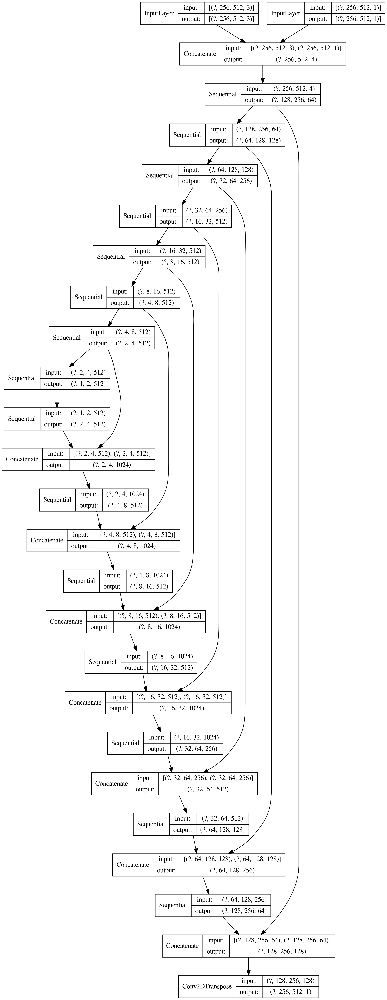

In [13]:
discriminator = new_Discriminator() 
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=256, show_layer_names=False)

# Функция потерь дискриминатора

Функция принимает вид:
$$ E_D = BCE( J, D(Y)) +  BCE( Z, D(G(X))) $$

где 
$E_D$ - функция потерь;

$BCE$ - функция вычисления бинарной кросс-энтропии; 

$J$ - матрица из единиц; 

$Z$ - матрица из нулей; 

$Y$ - реальная маска; 

$D(Y)$ - вывод дискриминатора при подаче реальной маски; 

$G(X)$ - вывод генератора при подаче реального изображения; 

$D(G(X))$ - вывод дискриминатора при подаче сгенерированной маски.

In [15]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_generated_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss

# Шаг обучения
Здесь производится вычисление функций потерь генератора и дискриминатора для партии изображений. Далее производится вычисление градиентов, необходимых для обновления весов в нейронных сетях.

In [19]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # вывод генератора при получении на вход реального изображения
        gen_output = generator(input_image, training=True)
        
        # вывод дискриминатора при получении на вход реальной маски сегментации
        disc_real_output = discriminator([input_image, target], training=True)
        # вывод дискриминатора при получении на вход сгенерированной маски сегментации
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        # вычисление функции потерь генератора
        gen_total_loss, gen_gan_loss, gen_l1_loss, mean_iou_loss, l2_loss = generator_loss(disc_generated_output, gen_output, target)
        # вычисление функции потерь дискриминатора
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
        
    # вычисление градиента для генератора    
    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    
    # вычисление градиента для дискриминатора  
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
    # применение градиента для генератора  
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    
    # применение градиента для дискриминатора  
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
 
    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss, mean_iou_loss, l2_loss

In [20]:
# Сбор статистики и функция для отрисовки графиков

gen_total_loss_list = []
gen_gan_loss_list = []
gen_l1_loss_list = []
disc_loss_list = []
mean_iou_loss_list = []
l2_loss_list = []
    
def draw_single_loss_plot(gen_total_loss_list, gen_gan_loss_list, gen_l1_loss_list, disc_loss_list,mean_iou_loss_list):
    x = np.arange(len(gen_total_loss_list), dtype=np.uint8)

    plt.plot(x, gen_total_loss_list, label='gen_total_loss_list')  # Plot some data on the (implicit) axes.
    plt.plot(x, gen_gan_loss_list, label='gen_gan_loss_list')  # etc.
    plt.plot(x, gen_l1_loss_list, label='gen_l1_loss_list')
    plt.plot(x, disc_loss_list, label='disc_loss_list')
    plt.plot(x, mean_iou_loss_list, label='mean_iou_loss_list')
    #plt.plot(x, mean_iou_loss_list, label='mean_iou_loss_list')
    #plt.plot(x, l2_loss_list, label='l2_loss_list')
    plt.xlabel('x label')
    plt.ylabel('y label')
    plt.title("Simple Plot")
    plt.axhline(y=0.69, color='r', linestyle='-')
    plt.legend()
    plt.show()

# Цикл обучения
Здесьь производится поулчение партии изображений, шаг обучения для полученной партии изображений, сохранение статистики и вывод изображений с графиками в конце каждой эпохи.

In [21]:
def fit(train_ds, epochs, test_ds, N=2975):
    
    for epoch in range(epochs):
        start = time.time()
        print("Epoch: ", epoch)

    # Train
        r = (TRAIN_SAMPLE + VAL_SAMPLE)//BATCH_SIZE
        for i in range(r):
            input_image = train_ds[i][0]
            target = train_ds[i][1]
            gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss, mean_iou_loss, l2_loss = train_step(input_image, target, epoch)
            
        print(f'gen_total_loss: {gen_total_loss}')
        print(f'gen_gan_loss: {gen_gan_loss}')
        print(f'disc_loss: {disc_loss}')  
        print(f'l1_loss_whole_epoch is {epoch_l1_loss.result()}')
        print(f'mean_iou_loss: {mean_iou.result()}')
        print(f'time {time.time()-start}')
        
        gen_total_loss_list.append(gen_total_loss)
        gen_gan_loss_list.append(gen_gan_loss)
        gen_l1_loss_list.append(epoch_l1_loss.result())
        disc_loss_list.append(disc_loss)
        mean_iou_loss_list.append(mean_iou.result())
        
        
        x = train_ds[0][0]
        y = train_ds[0][1]
        
        generate_images(generator, x, y, discriminator)
        generate_images(generator, test_ds[5][0], test_ds[5][1],discriminator)
        draw_single_loss_plot(gen_total_loss_list, gen_gan_loss_list, gen_l1_loss_list, disc_loss_list,mean_iou_loss_list)

        epoch_l1_loss.reset_states()
        mean_iou.reset_states()


In [22]:
x_train_path = os.path.join(PATH_DATASET, 'train_images')
x_val_path = os.path.join(PATH_DATASET, 'val_images')
y_train_path = os.path.join(PATH_DATASET, 'train_labels')
y_val_path = os.path.join(PATH_DATASET, 'val_labels')

x_train_files = sorted(os.listdir(os.path.join(x_train_path, 'img')))
x_val_files = sorted(os.listdir(os.path.join(x_val_path, 'img')))
y_train_files = sorted(os.listdir(os.path.join(y_train_path, 'img')))
y_val_files = sorted(os.listdir(os.path.join(y_val_path, 'img')))

X_together = []
new_way = os.path.join(x_train_path, 'img')
for i in x_train_files:
    new_path = os.path.join(new_way, i)
    X_together.append(new_path)
    
new_way = os.path.join(x_val_path, 'img')

for i in x_val_files:
    new_path = os.path.join(new_way, i)
    X_together.append(new_path)
    
Y_together = []
new_way = os.path.join(y_train_path, 'img')
for i in y_train_files:
    new_path = os.path.join(new_way, i)
    Y_together.append(new_path)
    
new_way = os.path.join(y_val_path, 'img')

for i in x_val_files:
    new_path = os.path.join(new_way, i)
    Y_together.append(new_path)


x_train_path = os.path.join(x_train_path, 'img')
x_val_path = os.path.join(x_val_path, 'img')
y_train_path = os.path.join(y_train_path, 'img')
y_val_path = os.path.join(y_val_path, 'img')


train_data = DataGenerator(
    TRAIN_SAMPLE + VAL_SAMPLE,
    X_together, 
    Y_together,
    is_train = True,
    debug_path=PATH_FOR_DEBUG
)

mean_iou = tf.keras.metrics.MeanIoU(num_classes=34)
epoch_l1_loss = tf.keras.metrics.MeanAbsoluteError()
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.9)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-2, beta_1=0.9)


Found 2975 images belonging to 1 classes.
Found 2975 images belonging to 1 classes.
Found 500 images belonging to 1 classes.
Found 500 images belonging to 1 classes.


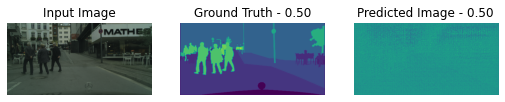

In [23]:
generate_images(generator, train_data[5][0], train_data[5][1],discriminator)

Epoch:  0
gen_total_loss: 7.44010591506958
gen_gan_loss: 0.5716639757156372
disc_loss: 1.3838006258010864
l2_loss: 0
l1_loss_whole_epoch is 0.08788881450891495
mean_iou_loss: 0.058521755039691925
time 266.6865427494049


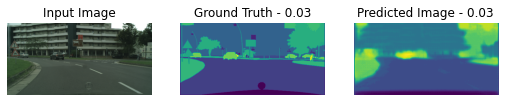

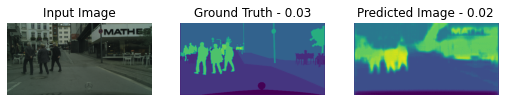

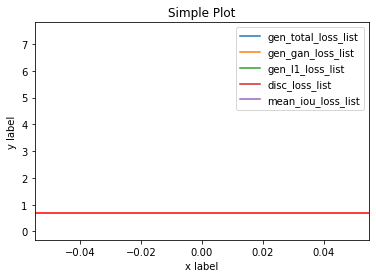

Epoch:  1
gen_total_loss: 6.869589805603027
gen_gan_loss: 0.6371723413467407
disc_loss: 1.2714985609054565
l2_loss: 0
l1_loss_whole_epoch is 0.06888587027788162
mean_iou_loss: 0.08857616037130356
time 239.03144192695618


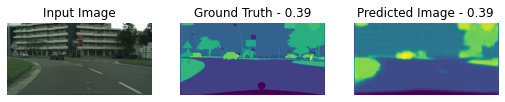

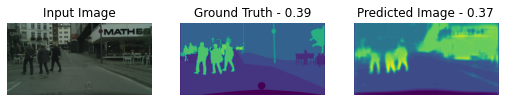

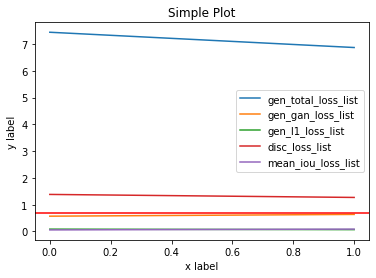

Epoch:  2
gen_total_loss: 6.335741996765137
gen_gan_loss: 0.6770823001861572
disc_loss: 1.3171484470367432
l2_loss: 0
l1_loss_whole_epoch is 0.06317340582609177
mean_iou_loss: 0.10432664304971695
time 240.50833201408386


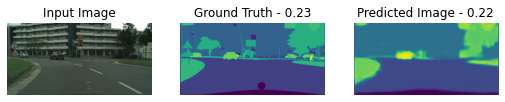

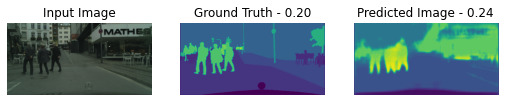

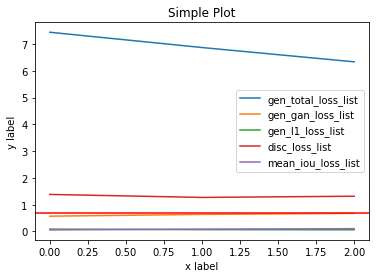

Epoch:  3
gen_total_loss: 5.996699333190918
gen_gan_loss: 0.6828341484069824
disc_loss: 1.1608449220657349
l2_loss: 0
l1_loss_whole_epoch is 0.05908164381980896
mean_iou_loss: 0.1124676838517189
time 239.5285506248474


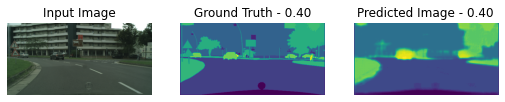

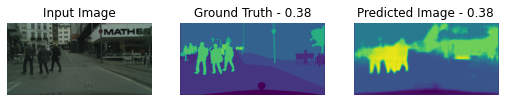

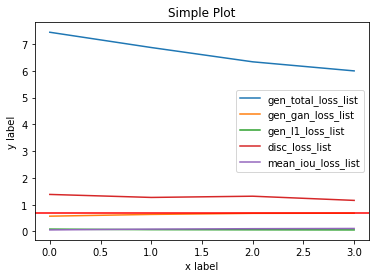

Epoch:  4
gen_total_loss: 5.758326530456543
gen_gan_loss: 0.6869504451751709
disc_loss: 1.1217222213745117
l2_loss: 0
l1_loss_whole_epoch is 0.05557204410433769
mean_iou_loss: 0.11974657326936722
time 321.09793424606323


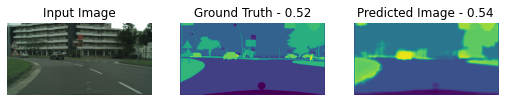

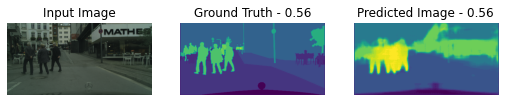

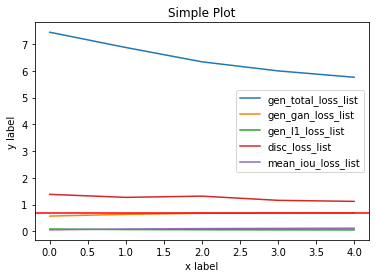

Epoch:  5
gen_total_loss: 5.486626148223877
gen_gan_loss: 0.6835961937904358
disc_loss: 1.0805699825286865
l2_loss: 0
l1_loss_whole_epoch is 0.05204782634973526
mean_iou_loss: 0.12782348692417145
time 242.5615804195404


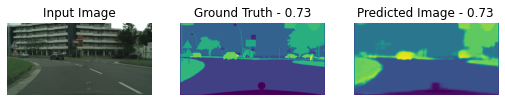

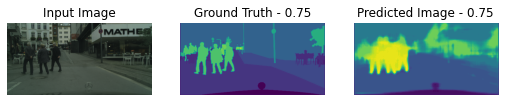

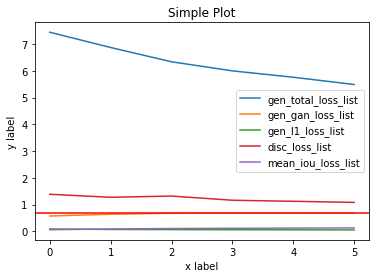

Epoch:  6
gen_total_loss: 5.236913204193115
gen_gan_loss: 0.6885194778442383
disc_loss: 1.385895013809204
l2_loss: 0
l1_loss_whole_epoch is 0.04924773797392845
mean_iou_loss: 0.1350773572921753
time 249.4588303565979


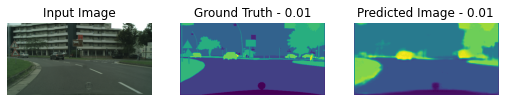

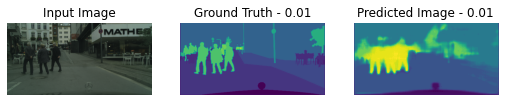

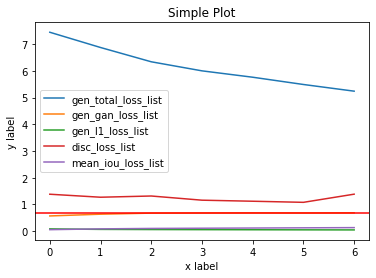

Epoch:  7
gen_total_loss: 5.090644359588623
gen_gan_loss: 0.686553955078125
disc_loss: 1.3847801685333252
l2_loss: 0
l1_loss_whole_epoch is 0.04625789076089859
mean_iou_loss: 0.14427372813224792
time 241.86985182762146


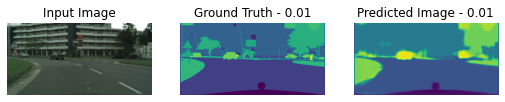

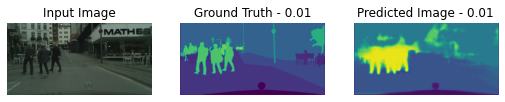

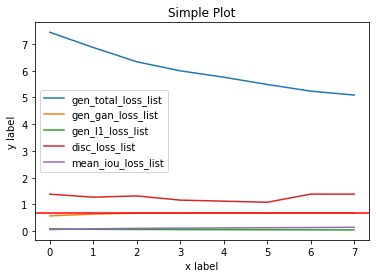

Epoch:  8
gen_total_loss: 4.9587721824646
gen_gan_loss: 0.684819757938385
disc_loss: 1.0786243677139282
l2_loss: 0
l1_loss_whole_epoch is 0.0436832420527935
mean_iou_loss: 0.15046487748622894
time 237.0492262840271


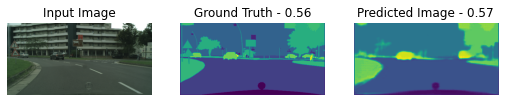

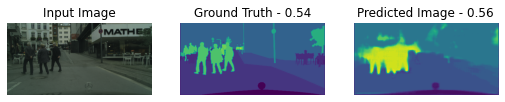

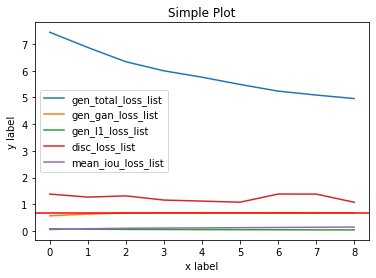

Epoch:  9
gen_total_loss: 4.7305192947387695
gen_gan_loss: 0.6850508451461792
disc_loss: 1.2544219493865967
l2_loss: 0
l1_loss_whole_epoch is 0.041615162044763565
mean_iou_loss: 0.15534241497516632
time 237.0771288871765


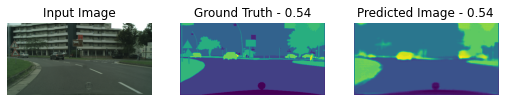

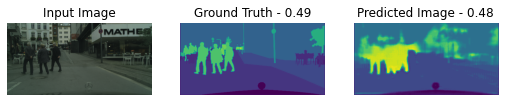

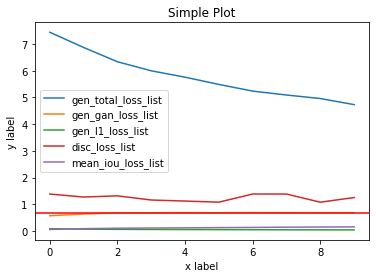

In [24]:
fit(train_data, 10, train_data)


Epoch:  0
gen_total_loss: 4.506905555725098
gen_gan_loss: 0.6828200221061707
disc_loss: 1.0990208387374878
l2_loss: 0
l1_loss_whole_epoch is 0.039846405386924744
mean_iou_loss: 0.1604248434305191
time 234.7895061969757


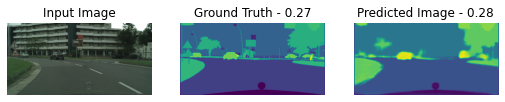

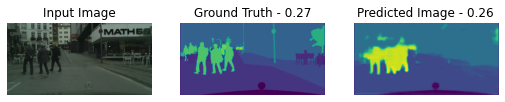

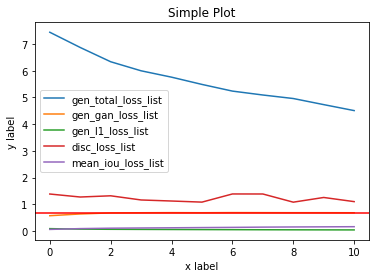

Epoch:  1
gen_total_loss: 4.5210065841674805
gen_gan_loss: 0.6880921721458435
disc_loss: 1.3861703872680664
l2_loss: 0
l1_loss_whole_epoch is 0.03847751393914223
mean_iou_loss: 0.16552740335464478
time 230.7060990333557


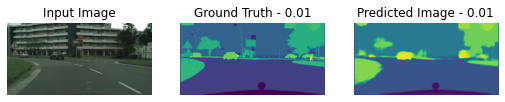

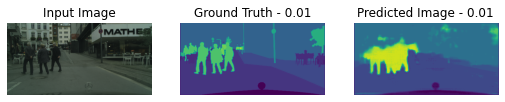

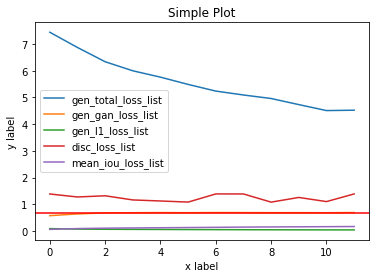

Epoch:  2
gen_total_loss: 4.211288928985596
gen_gan_loss: 0.6703901886940002
disc_loss: 1.1080169677734375
l2_loss: 0
l1_loss_whole_epoch is 0.03709636256098747
mean_iou_loss: 0.17077010869979858
time 231.66421246528625


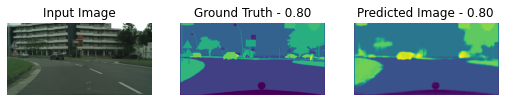

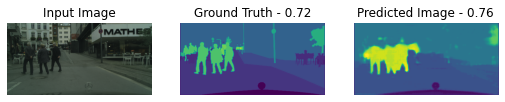

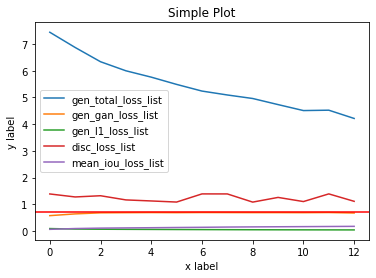

Epoch:  3
gen_total_loss: 4.202475070953369
gen_gan_loss: 0.6871088743209839
disc_loss: 1.0406978130340576
l2_loss: 0
l1_loss_whole_epoch is 0.036309320479631424
mean_iou_loss: 0.1731048971414566
time 229.95848321914673


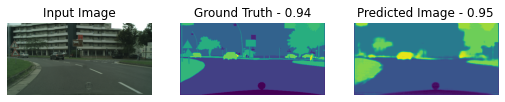

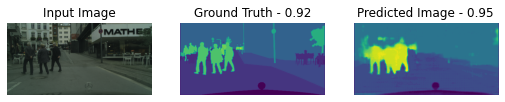

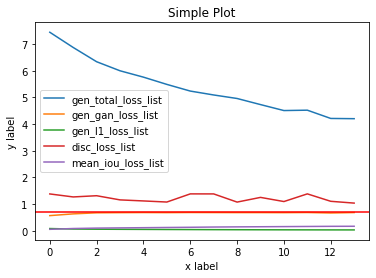

Epoch:  4
gen_total_loss: 3.9255619049072266
gen_gan_loss: 0.687820553779602
disc_loss: 1.3861849308013916
l2_loss: 0
l1_loss_whole_epoch is 0.03486039862036705
mean_iou_loss: 0.1800903081893921
time 230.48509788513184


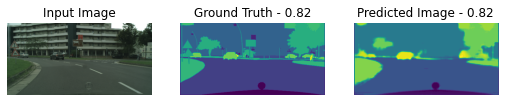

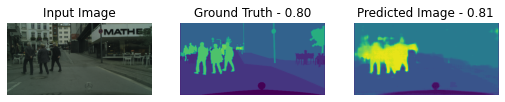

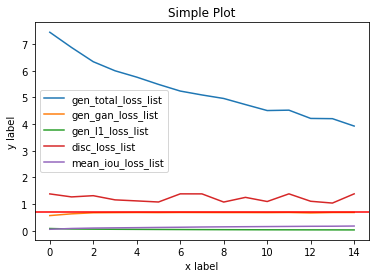

Epoch:  5
gen_total_loss: 3.8373193740844727
gen_gan_loss: 0.6914684772491455
disc_loss: 1.1209391355514526
l2_loss: 0
l1_loss_whole_epoch is 0.03427658602595329
mean_iou_loss: 0.18361042439937592
time 230.73348712921143


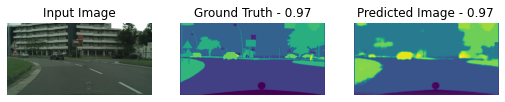

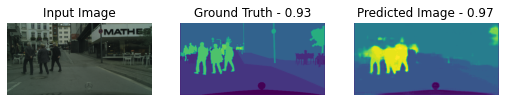

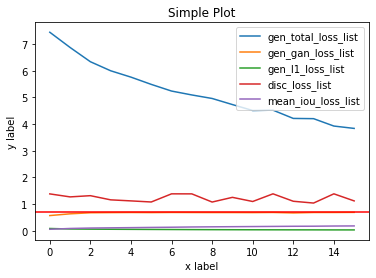

Epoch:  6
gen_total_loss: 3.8518619537353516
gen_gan_loss: 0.6877379417419434
disc_loss: 1.3860936164855957
l2_loss: 0
l1_loss_whole_epoch is 0.034283146262168884
mean_iou_loss: 0.18414174020290375
time 230.89888334274292


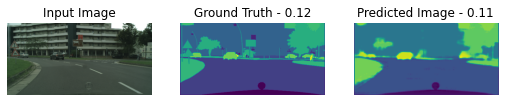

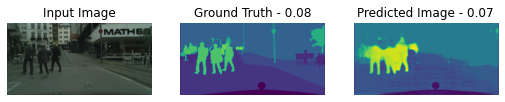

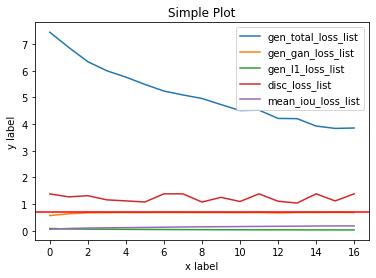

Epoch:  7
gen_total_loss: 3.7013375759124756
gen_gan_loss: 0.6905848383903503
disc_loss: 1.386490821838379
l2_loss: 0
l1_loss_whole_epoch is 0.03330175578594208
mean_iou_loss: 0.18842539191246033
time 234.9693202972412


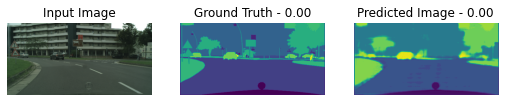

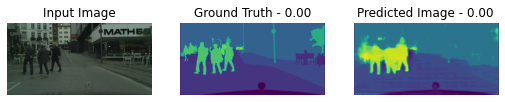

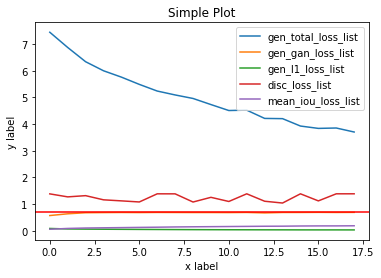

Epoch:  8
gen_total_loss: 3.442849636077881
gen_gan_loss: 0.6918779611587524
disc_loss: 1.3862950801849365
l2_loss: 0
l1_loss_whole_epoch is 0.03213435411453247
mean_iou_loss: 0.1938415914773941
time 230.85811805725098


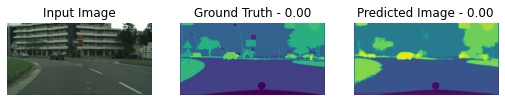

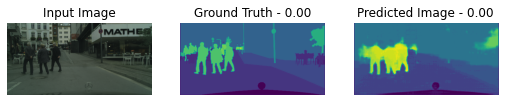

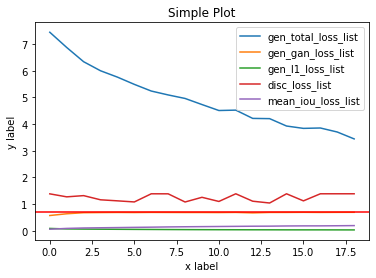

Epoch:  9
gen_total_loss: 3.3644869327545166
gen_gan_loss: 0.6917274594306946
disc_loss: 1.3862669467926025
l2_loss: 0
l1_loss_whole_epoch is 0.031298961490392685
mean_iou_loss: 0.19821996986865997
time 230.62692785263062


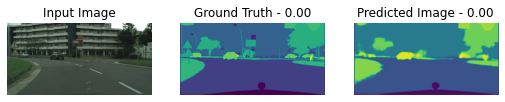

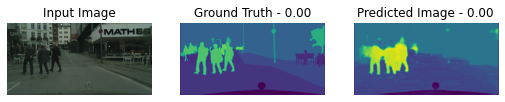

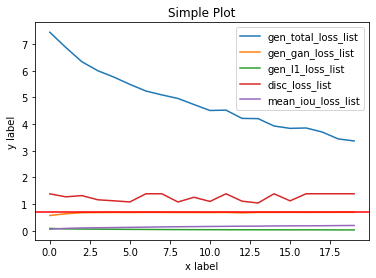

In [25]:
fit(train_data, 10, train_data)


In [26]:
generator.save(r'/kaggle/working/generator_improved.h5')

Epoch:  0
gen_total_loss: 3.248109817504883
gen_gan_loss: 0.6915396451950073
disc_loss: 1.3861535787582397
l2_loss: 0
l1_loss_whole_epoch is 0.03046504780650139
mean_iou_loss: 0.20292840898036957
time 230.8045620918274


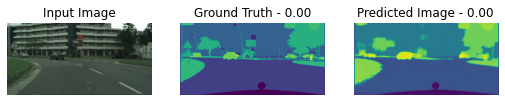

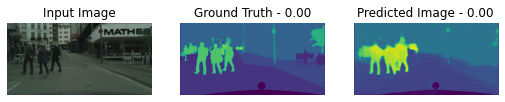

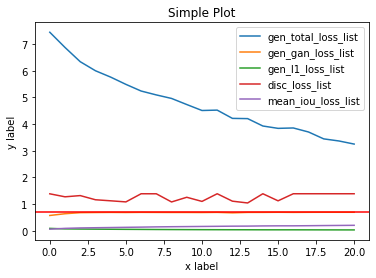

Epoch:  1
gen_total_loss: 3.17734432220459
gen_gan_loss: 0.6904425024986267
disc_loss: 1.3858823776245117
l2_loss: 0
l1_loss_whole_epoch is 0.030039003118872643
mean_iou_loss: 0.20705024898052216
time 230.7156102657318


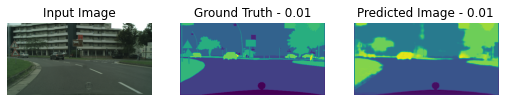

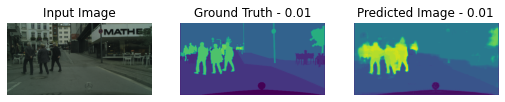

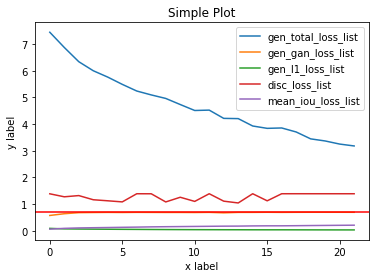

Epoch:  2
gen_total_loss: 3.1010138988494873
gen_gan_loss: 0.6879622936248779
disc_loss: 1.3845124244689941
l2_loss: 0
l1_loss_whole_epoch is 0.029245806857943535
mean_iou_loss: 0.2123083621263504
time 230.6231825351715


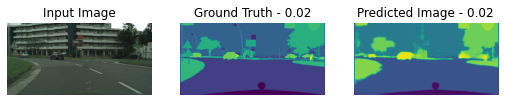

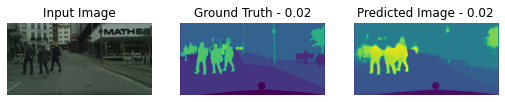

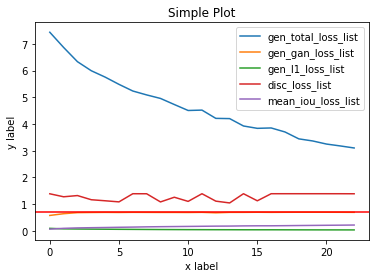

Epoch:  3
gen_total_loss: 3.0729565620422363
gen_gan_loss: 0.6479032635688782
disc_loss: 1.2386409044265747
l2_loss: 0
l1_loss_whole_epoch is 0.029679838567972183
mean_iou_loss: 0.211411714553833
time 229.51688647270203


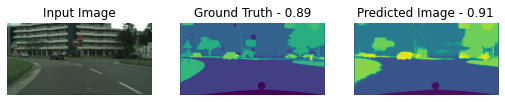

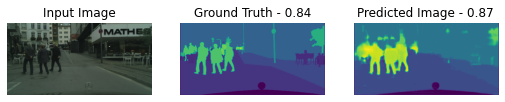

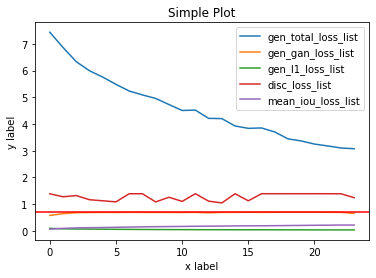

Epoch:  4
gen_total_loss: 2.989589214324951
gen_gan_loss: 0.6918042898178101
disc_loss: 1.386319637298584
l2_loss: 0
l1_loss_whole_epoch is 0.029544459655880928
mean_iou_loss: 0.21156732738018036
time 229.86994767189026


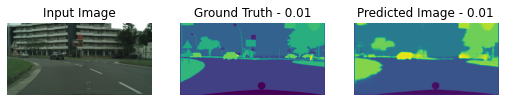

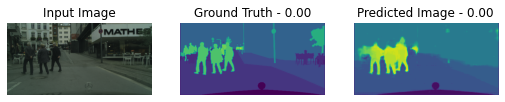

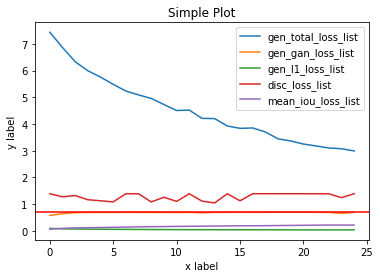

Epoch:  5
gen_total_loss: 3.0459702014923096
gen_gan_loss: 0.6915631890296936
disc_loss: 1.214296817779541
l2_loss: 0
l1_loss_whole_epoch is 0.02832704596221447
mean_iou_loss: 0.2183959037065506
time 231.11844158172607


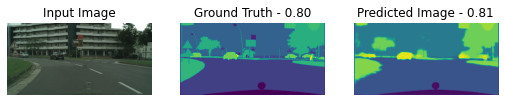

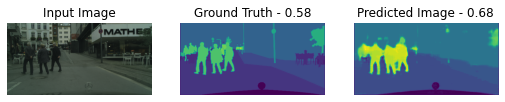

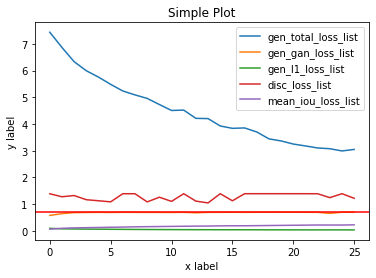

Epoch:  6
gen_total_loss: 3.145130157470703
gen_gan_loss: 0.690273642539978
disc_loss: 1.3853764533996582
l2_loss: 0
l1_loss_whole_epoch is 0.02800239436328411
mean_iou_loss: 0.22420276701450348
time 234.13496208190918


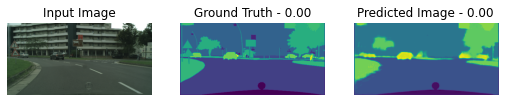

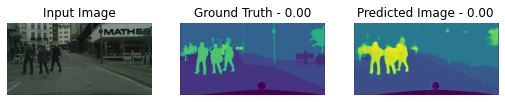

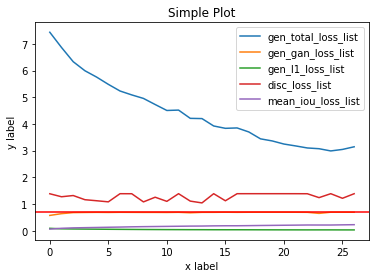

Epoch:  7
gen_total_loss: 2.893794536590576
gen_gan_loss: 0.691758930683136
disc_loss: 1.0391409397125244
l2_loss: 0
l1_loss_whole_epoch is 0.0274807121604681
mean_iou_loss: 0.22705236077308655
time 264.2418556213379


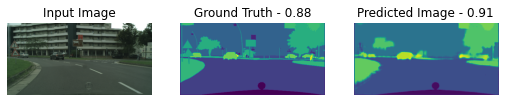

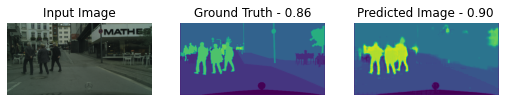

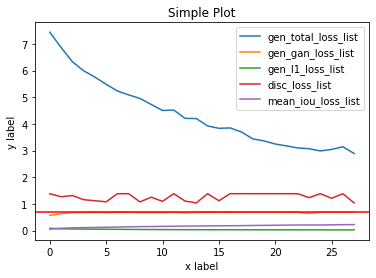

Epoch:  8
gen_total_loss: 3.003126382827759
gen_gan_loss: 0.6721451282501221
disc_loss: 1.3591828346252441
l2_loss: 0
l1_loss_whole_epoch is 0.027158472687005997
mean_iou_loss: 0.2301744669675827
time 230.18200850486755


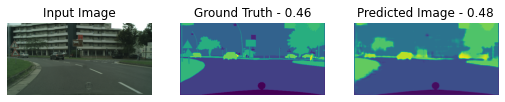

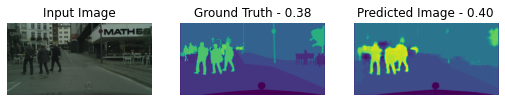

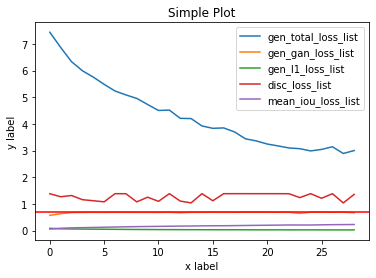

Epoch:  9
gen_total_loss: 2.8440470695495605
gen_gan_loss: 0.6925007104873657
disc_loss: 1.3863143920898438
l2_loss: 0
l1_loss_whole_epoch is 0.02762228064239025
mean_iou_loss: 0.22839055955410004
time 229.68726921081543


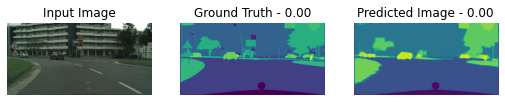

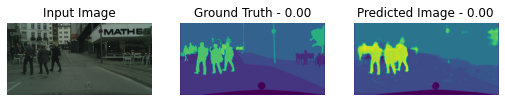

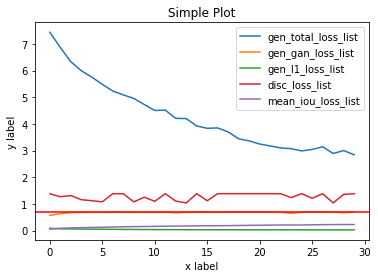

Epoch:  10
gen_total_loss: 2.7512545585632324
gen_gan_loss: 0.6915799379348755
disc_loss: 1.3862618207931519
l2_loss: 0
l1_loss_whole_epoch is 0.025996718555688858
mean_iou_loss: 0.23924602568149567
time 235.8178882598877


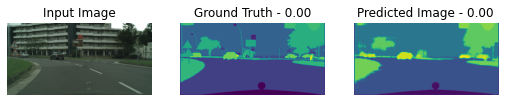

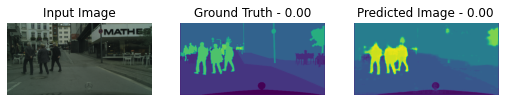

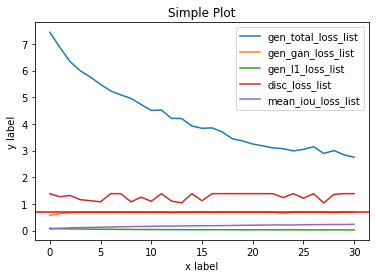

Epoch:  11
gen_total_loss: 2.668835401535034
gen_gan_loss: 0.6895946264266968
disc_loss: 1.0393035411834717
l2_loss: 0
l1_loss_whole_epoch is 0.025378376245498657
mean_iou_loss: 0.24348115921020508
time 235.51910305023193


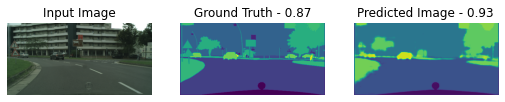

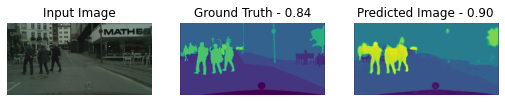

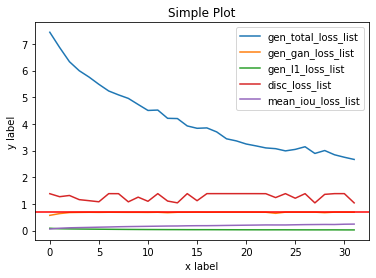

Epoch:  12
gen_total_loss: 2.750722885131836
gen_gan_loss: 0.6898893713951111
disc_loss: 1.3822968006134033
l2_loss: 0
l1_loss_whole_epoch is 0.025711771100759506
mean_iou_loss: 0.24254286289215088
time 235.58872890472412


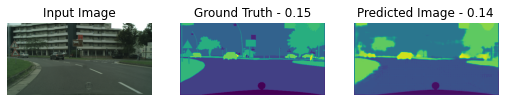

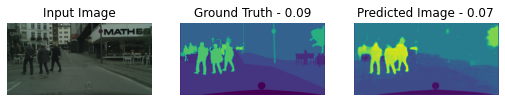

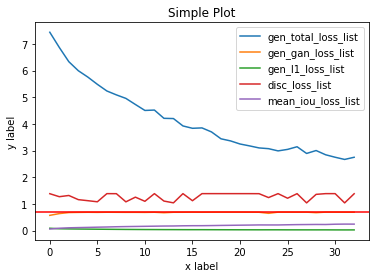

Epoch:  13
gen_total_loss: 2.8485352993011475
gen_gan_loss: 0.6925678253173828
disc_loss: 1.0250473022460938
l2_loss: 0
l1_loss_whole_epoch is 0.025818919762969017
mean_iou_loss: 0.24214302003383636
time 243.68054914474487


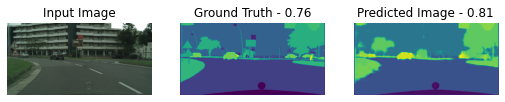

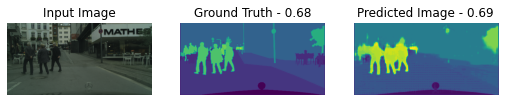

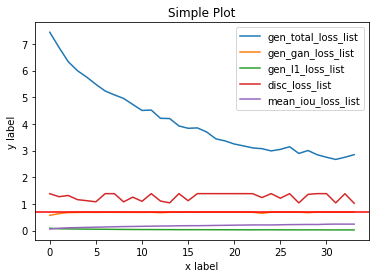

Epoch:  14
gen_total_loss: 2.543377637863159
gen_gan_loss: 0.5704410672187805
disc_loss: 1.1761560440063477
l2_loss: 0
l1_loss_whole_epoch is 0.025495685636997223
mean_iou_loss: 0.24296939373016357
time 236.54526329040527


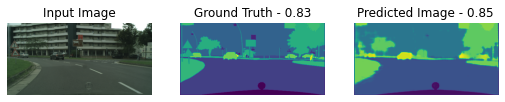

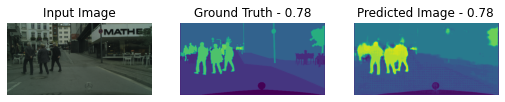

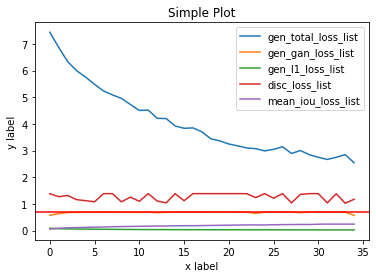

In [27]:
fit(train_data, 15, train_data)

Epoch:  0
gen_total_loss: 2.697023630142212
gen_gan_loss: 0.6751280426979065
disc_loss: 1.370284080505371
l2_loss: 0
l1_loss_whole_epoch is 0.02553793601691723
mean_iou_loss: 0.24666166305541992
time 230.83042168617249


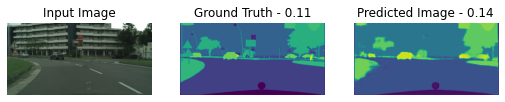

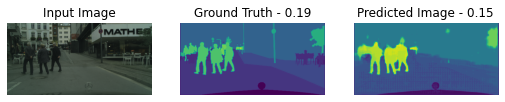

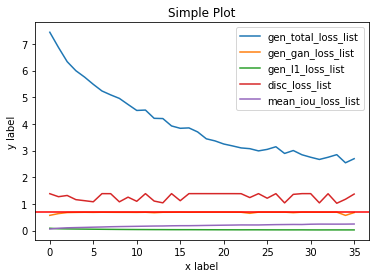

Epoch:  1
gen_total_loss: 2.5753681659698486
gen_gan_loss: 0.6924222111701965
disc_loss: 1.028563141822815
l2_loss: 0
l1_loss_whole_epoch is 0.02491001784801483
mean_iou_loss: 0.24975599348545074
time 230.69971013069153


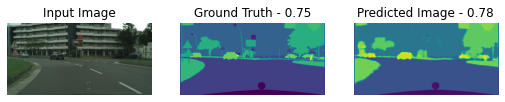

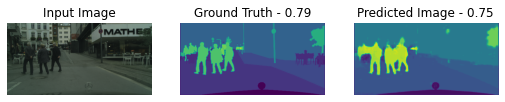

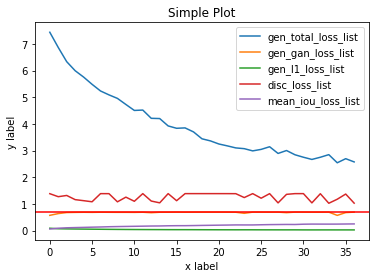

Epoch:  2
gen_total_loss: 2.6306962966918945
gen_gan_loss: 0.692946195602417
disc_loss: 1.0307561159133911
l2_loss: 0
l1_loss_whole_epoch is 0.025222985073924065
mean_iou_loss: 0.25026485323905945
time 231.00952291488647


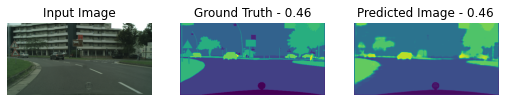

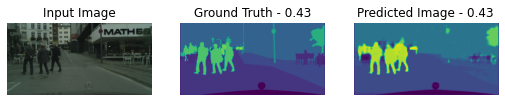

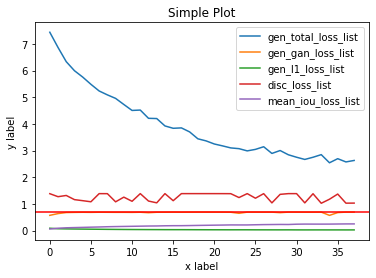

Epoch:  3
gen_total_loss: 2.637559175491333
gen_gan_loss: 0.6930069327354431
disc_loss: 1.3862574100494385
l2_loss: 0
l1_loss_whole_epoch is 0.02466508187353611
mean_iou_loss: 0.252652645111084
time 240.63565587997437


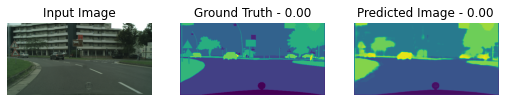

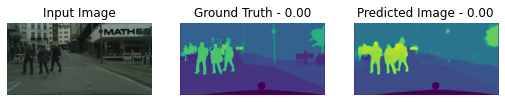

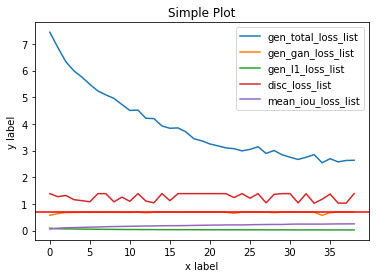

Epoch:  4
gen_total_loss: 2.5254905223846436
gen_gan_loss: 0.6915140748023987
disc_loss: 1.3860059976577759
l2_loss: 0
l1_loss_whole_epoch is 0.02370382286608219
mean_iou_loss: 0.25663039088249207
time 230.77612590789795


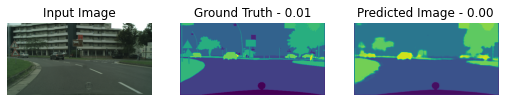

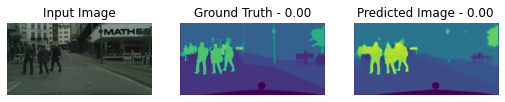

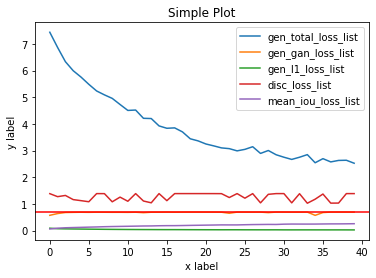

Epoch:  5
gen_total_loss: 2.781832218170166
gen_gan_loss: 0.6785227060317993
disc_loss: 1.4011647701263428
l2_loss: 0
l1_loss_whole_epoch is 0.022857824340462685
mean_iou_loss: 0.2633925676345825
time 230.9349000453949


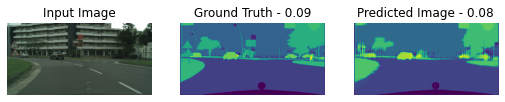

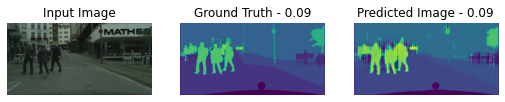

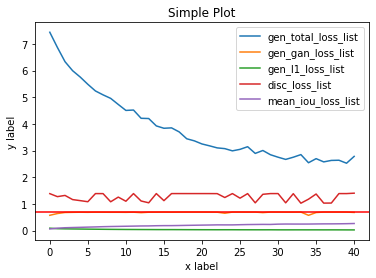

Epoch:  6
gen_total_loss: 2.605332612991333
gen_gan_loss: 0.6922119855880737
disc_loss: 1.3849210739135742
l2_loss: 0
l1_loss_whole_epoch is 0.02295897901058197
mean_iou_loss: 0.2653200030326843
time 231.45049858093262


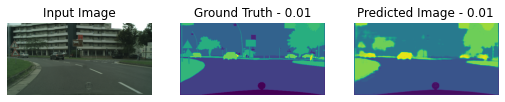

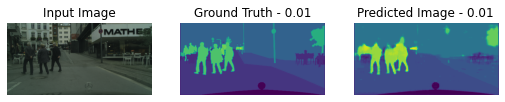

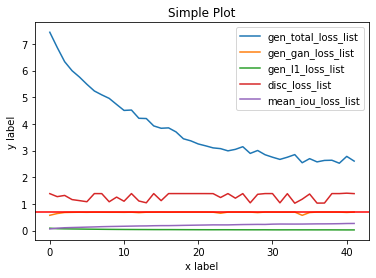

Epoch:  7
gen_total_loss: 2.485734462738037
gen_gan_loss: 0.6818118095397949
disc_loss: 1.0332770347595215
l2_loss: 0
l1_loss_whole_epoch is 0.022909656167030334
mean_iou_loss: 0.26752015948295593
time 230.2404499053955


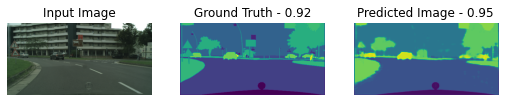

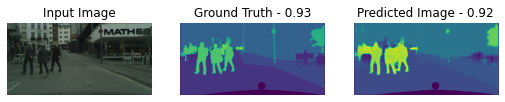

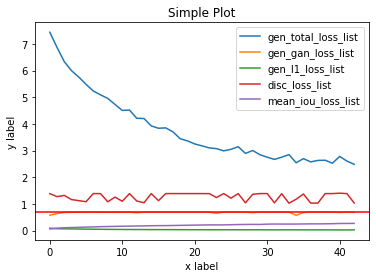

Epoch:  8
gen_total_loss: 2.4339709281921387
gen_gan_loss: 0.6930218935012817
disc_loss: 1.02426016330719
l2_loss: 0
l1_loss_whole_epoch is 0.02368776686489582
mean_iou_loss: 0.2609143555164337
time 230.35841035842896


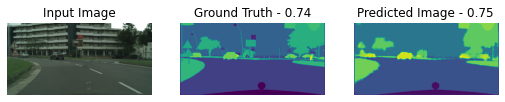

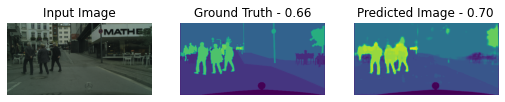

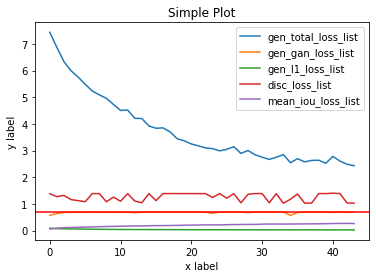

Epoch:  9
gen_total_loss: 2.4241158962249756
gen_gan_loss: 0.6926659345626831
disc_loss: 1.0208752155303955
l2_loss: 0
l1_loss_whole_epoch is 0.02331886626780033
mean_iou_loss: 0.26734307408332825
time 231.50409412384033


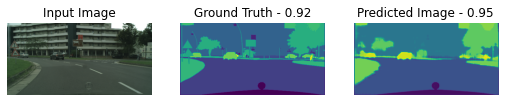

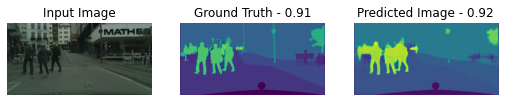

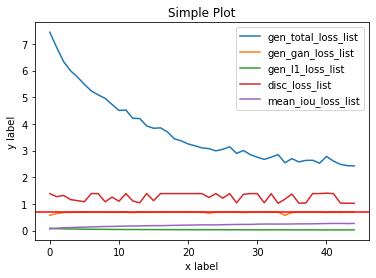

Epoch:  10
gen_total_loss: 2.6061348915100098
gen_gan_loss: 0.684428870677948
disc_loss: 1.0304644107818604
l2_loss: 0
l1_loss_whole_epoch is 0.022763386368751526
mean_iou_loss: 0.269070565700531
time 236.00760579109192


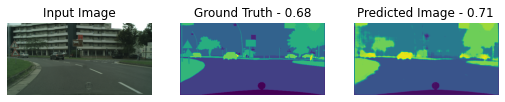

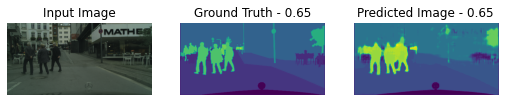

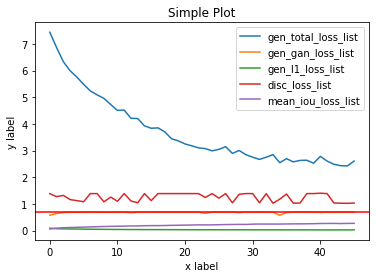

Epoch:  11
gen_total_loss: 2.6599104404449463
gen_gan_loss: 0.6919180750846863
disc_loss: 1.3859074115753174
l2_loss: 0
l1_loss_whole_epoch is 0.022580493241548538
mean_iou_loss: 0.2747000753879547
time 233.4068787097931


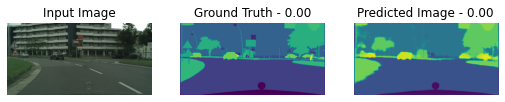

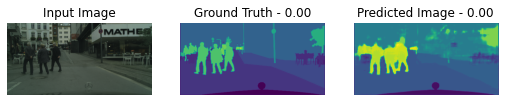

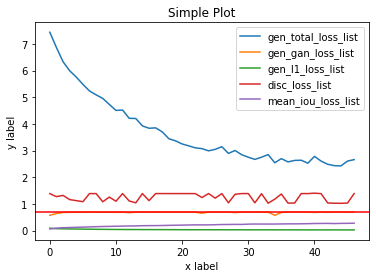

Epoch:  12
gen_total_loss: 2.512389898300171
gen_gan_loss: 0.6882854104042053
disc_loss: 1.3788352012634277
l2_loss: 0
l1_loss_whole_epoch is 0.022048819810152054
mean_iou_loss: 0.2740195095539093
time 230.72002959251404


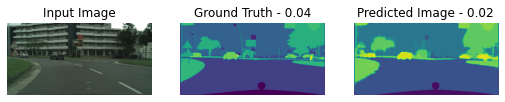

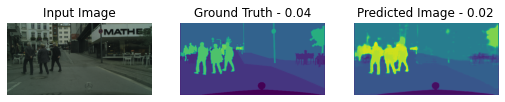

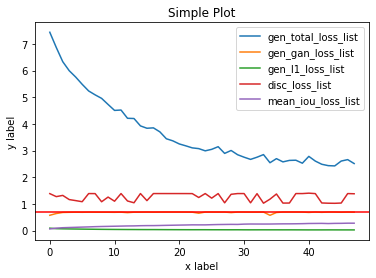

Epoch:  13
gen_total_loss: 2.365751266479492
gen_gan_loss: 0.6837292909622192
disc_loss: 1.07207453250885
l2_loss: 0
l1_loss_whole_epoch is 0.022204844281077385
mean_iou_loss: 0.2747473418712616
time 229.93829917907715


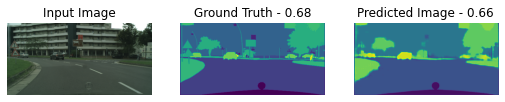

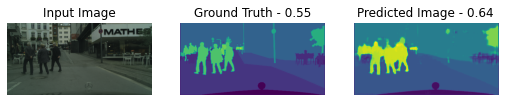

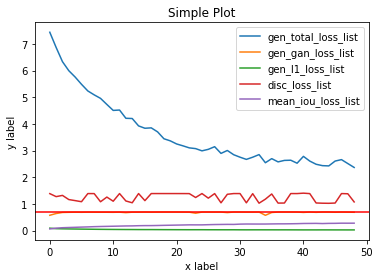

Epoch:  14
gen_total_loss: 2.3229637145996094
gen_gan_loss: 0.516537070274353
disc_loss: 1.3239372968673706
l2_loss: 0
l1_loss_whole_epoch is 0.022198911756277084
mean_iou_loss: 0.2761424481868744
time 230.605651140213


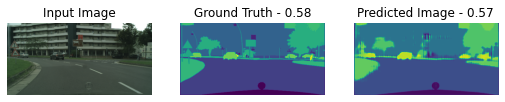

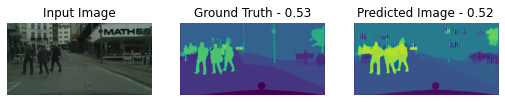

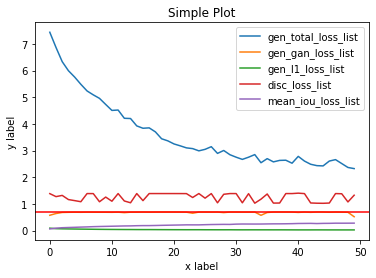

In [28]:

fit(train_data, 15, train_data)

Epoch:  0
gen_total_loss: 2.3421194553375244
gen_gan_loss: 0.6922149062156677
disc_loss: 1.3857142925262451
l2_loss: 0
l1_loss_whole_epoch is 0.021903468295931816
mean_iou_loss: 0.2791275680065155
time 230.74327087402344


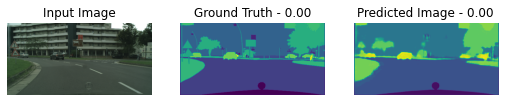

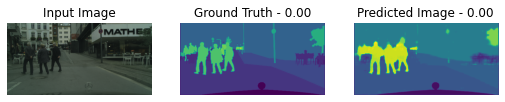

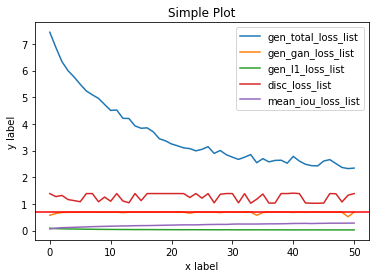

Epoch:  1
gen_total_loss: 2.579589605331421
gen_gan_loss: 0.6613218188285828
disc_loss: 1.070033073425293
l2_loss: 0
l1_loss_whole_epoch is 0.021412022411823273
mean_iou_loss: 0.2824651896953583
time 230.2099006175995


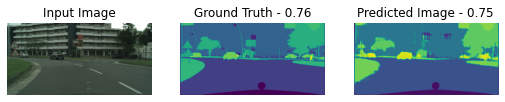

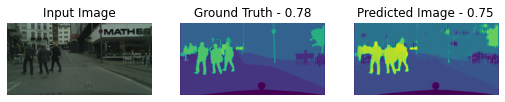

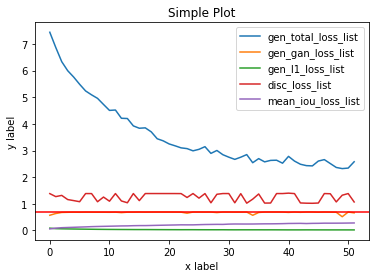

Epoch:  2
gen_total_loss: 2.297452449798584
gen_gan_loss: 0.6888885498046875
disc_loss: 1.3866746425628662
l2_loss: 0
l1_loss_whole_epoch is 0.02235431782901287
mean_iou_loss: 0.2768925130367279
time 231.6244876384735


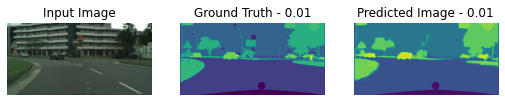

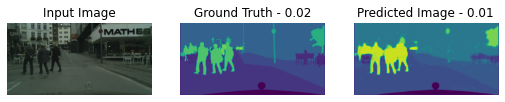

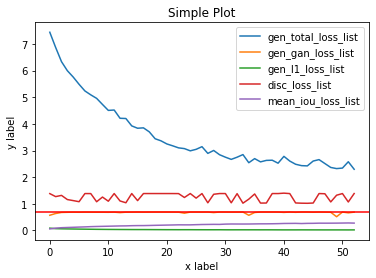

Epoch:  3
gen_total_loss: 2.2235374450683594
gen_gan_loss: 0.6889351606369019
disc_loss: 1.3692536354064941
l2_loss: 0
l1_loss_whole_epoch is 0.021789168938994408
mean_iou_loss: 0.28216975927352905
time 230.32157945632935


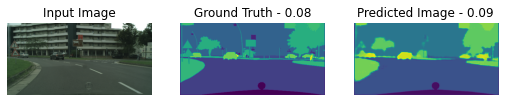

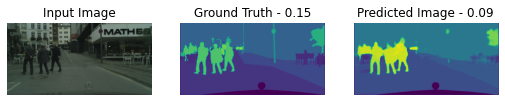

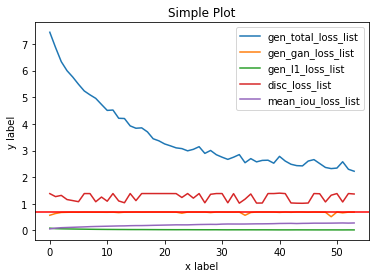

Epoch:  4
gen_total_loss: 2.3194212913513184
gen_gan_loss: 0.6931139826774597
disc_loss: 1.3861515522003174
l2_loss: 0
l1_loss_whole_epoch is 0.02117837779223919
mean_iou_loss: 0.28601744771003723
time 230.7294042110443


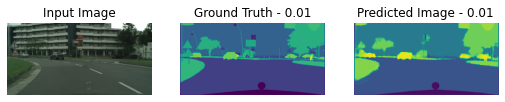

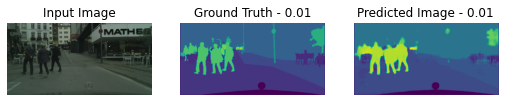

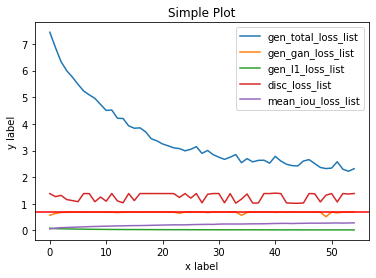

Epoch:  5
gen_total_loss: 2.2105464935302734
gen_gan_loss: 0.6921724081039429
disc_loss: 1.386212944984436
l2_loss: 0
l1_loss_whole_epoch is 0.02062564343214035
mean_iou_loss: 0.294325053691864
time 230.51016497612


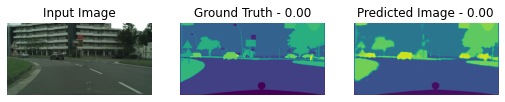

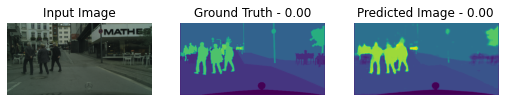

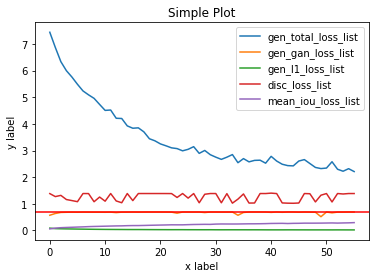

Epoch:  6
gen_total_loss: 2.366650342941284
gen_gan_loss: 0.6929729580879211
disc_loss: 1.3862347602844238
l2_loss: 0
l1_loss_whole_epoch is 0.02069256454706192
mean_iou_loss: 0.29329684376716614
time 231.44196367263794


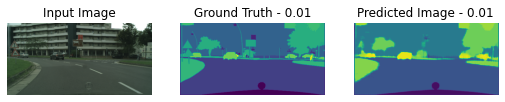

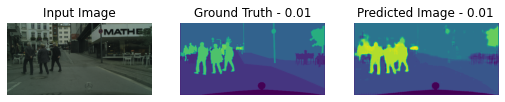

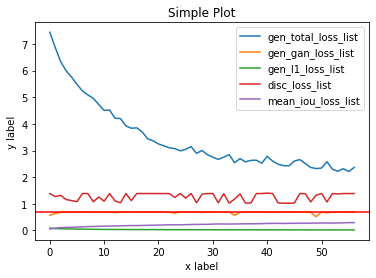

Epoch:  7
gen_total_loss: 2.201571464538574
gen_gan_loss: 0.6927251219749451
disc_loss: 1.3861886262893677
l2_loss: 0
l1_loss_whole_epoch is 0.020178664475679398
mean_iou_loss: 0.29539623856544495
time 231.84999895095825


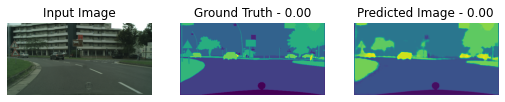

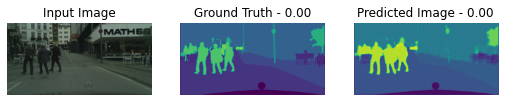

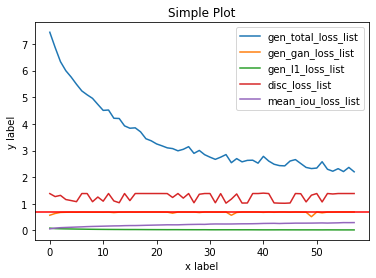

Epoch:  8
gen_total_loss: 2.149902820587158
gen_gan_loss: 0.6922918558120728
disc_loss: 1.386100172996521
l2_loss: 0
l1_loss_whole_epoch is 0.01951095648109913
mean_iou_loss: 0.30215516686439514
time 230.71718502044678


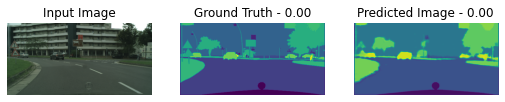

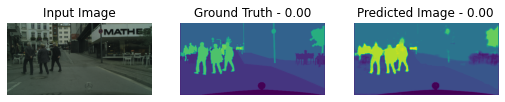

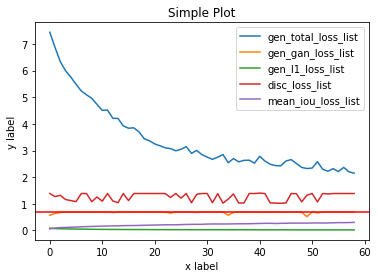

Epoch:  9
gen_total_loss: 2.146984577178955
gen_gan_loss: 0.6919509172439575
disc_loss: 1.385995864868164
l2_loss: 0
l1_loss_whole_epoch is 0.01935134455561638
mean_iou_loss: 0.29820212721824646
time 230.96695947647095


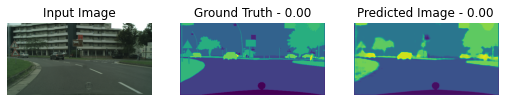

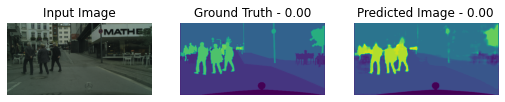

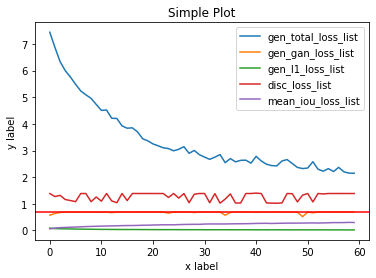

Epoch:  10
gen_total_loss: 2.1491823196411133
gen_gan_loss: 0.6920444965362549
disc_loss: 1.385066032409668
l2_loss: 0
l1_loss_whole_epoch is 0.019073164090514183
mean_iou_loss: 0.3113166391849518
time 231.46364831924438


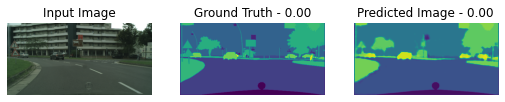

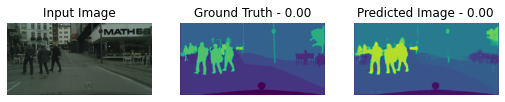

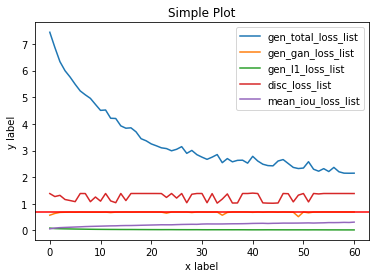

Epoch:  11
gen_total_loss: 2.3456945419311523
gen_gan_loss: 0.6908742189407349
disc_loss: 1.0294604301452637
l2_loss: 0
l1_loss_whole_epoch is 0.019481690600514412
mean_iou_loss: 0.30745548009872437
time 241.2798855304718


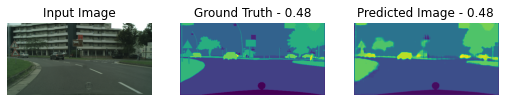

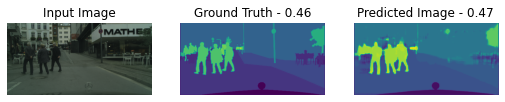

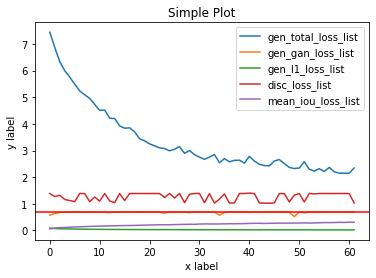

Epoch:  12
gen_total_loss: 2.1451852321624756
gen_gan_loss: 0.6923938393592834
disc_loss: 1.386249303817749
l2_loss: 0
l1_loss_whole_epoch is 0.01942552626132965
mean_iou_loss: 0.307655394077301
time 233.279527425766


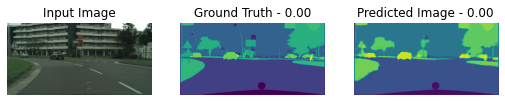

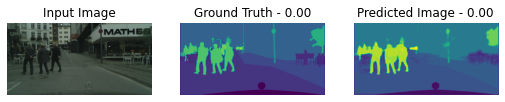

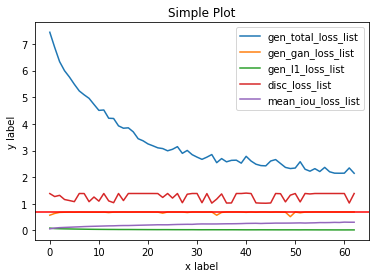

Epoch:  13
gen_total_loss: 2.0453810691833496
gen_gan_loss: 0.5161087512969971
disc_loss: 1.4284753799438477
l2_loss: 0
l1_loss_whole_epoch is 0.01874396950006485
mean_iou_loss: 0.3127695322036743
time 231.94751071929932


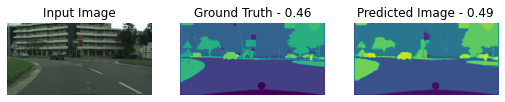

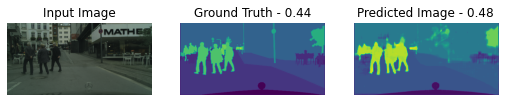

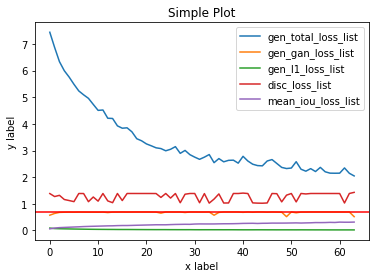

Epoch:  14
gen_total_loss: 2.323357105255127
gen_gan_loss: 0.6927238702774048
disc_loss: 1.3862617015838623
l2_loss: 0
l1_loss_whole_epoch is 0.019681517034769058
mean_iou_loss: 0.30117106437683105
time 236.31726908683777


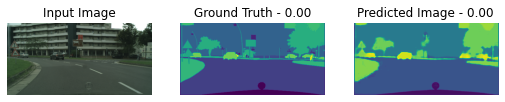

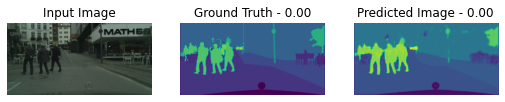

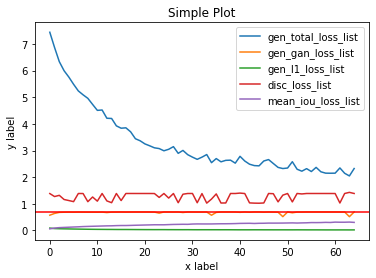

In [29]:
fit(train_data, 15, train_data)

Epoch:  0
gen_total_loss: 1.9492560625076294
gen_gan_loss: 0.4361043870449066
disc_loss: 1.5071278810501099
l2_loss: 0
l1_loss_whole_epoch is 0.018631625920534134
mean_iou_loss: 0.3174900710582733
time 233.17445182800293


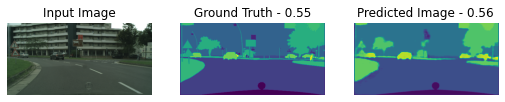

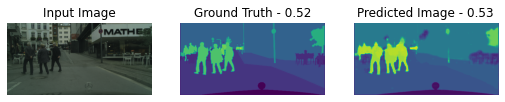

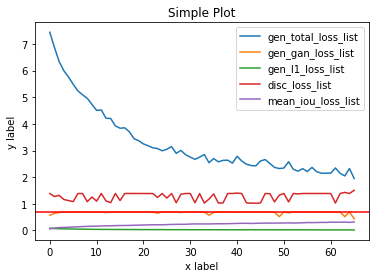

Epoch:  1
gen_total_loss: 2.0814242362976074
gen_gan_loss: 0.5775909423828125
disc_loss: 1.4988131523132324
l2_loss: 0
l1_loss_whole_epoch is 0.019451260566711426
mean_iou_loss: 0.3104051649570465
time 235.37598395347595


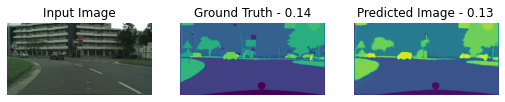

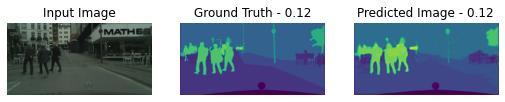

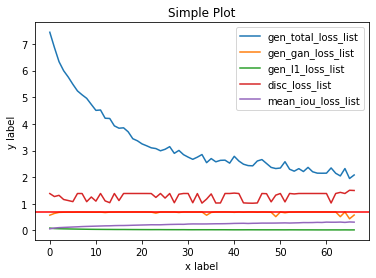

Epoch:  2
gen_total_loss: 2.1952128410339355
gen_gan_loss: 0.6931425333023071
disc_loss: 1.386289358139038
l2_loss: 0
l1_loss_whole_epoch is 0.018817633390426636
mean_iou_loss: 0.31539979577064514
time 233.93768095970154


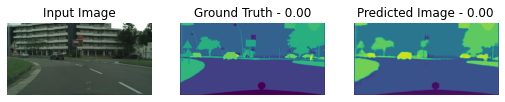

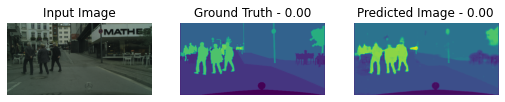

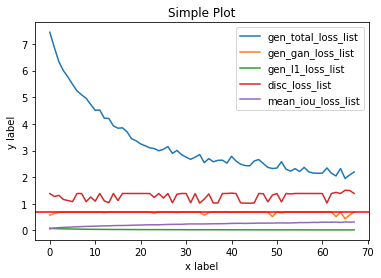

Epoch:  3
gen_total_loss: 2.089742660522461
gen_gan_loss: 0.6171873211860657
disc_loss: 1.1229045391082764
l2_loss: 0
l1_loss_whole_epoch is 0.01834987848997116
mean_iou_loss: 0.32020097970962524
time 234.06931924819946


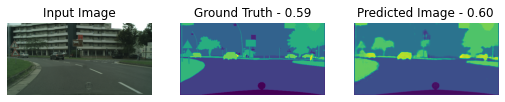

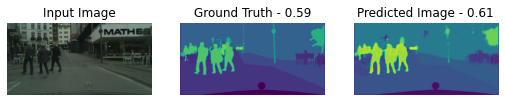

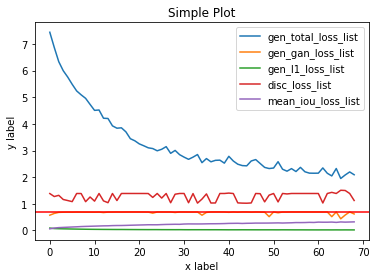

Epoch:  4
gen_total_loss: 2.28602933883667
gen_gan_loss: 0.693142294883728
disc_loss: 1.386289119720459
l2_loss: 0
l1_loss_whole_epoch is 0.01918148435652256
mean_iou_loss: 0.3094026744365692
time 242.2023847103119


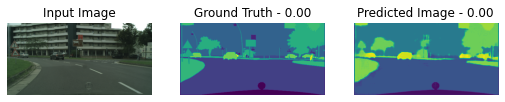

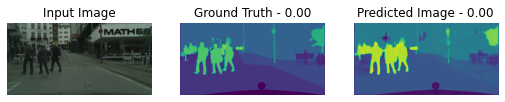

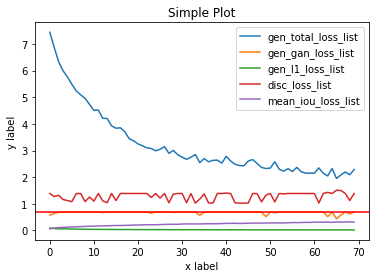

Epoch:  5
gen_total_loss: 2.090660333633423
gen_gan_loss: 0.6931414008140564
disc_loss: 1.3862860202789307
l2_loss: 0
l1_loss_whole_epoch is 0.018895210698246956
mean_iou_loss: 0.3129640519618988
time 232.7679672241211


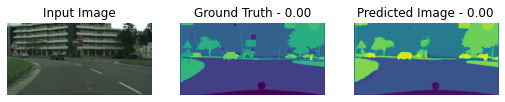

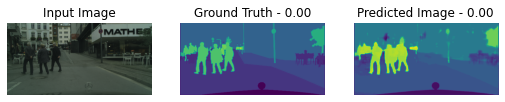

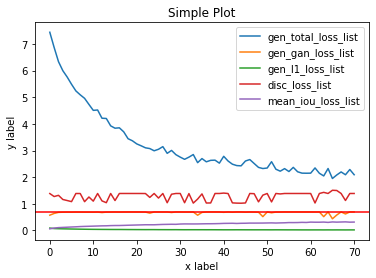

Epoch:  6
gen_total_loss: 2.1078972816467285
gen_gan_loss: 0.6931382417678833
disc_loss: 1.386281967163086
l2_loss: 0
l1_loss_whole_epoch is 0.018282519653439522
mean_iou_loss: 0.3179035782814026
time 232.49878358840942


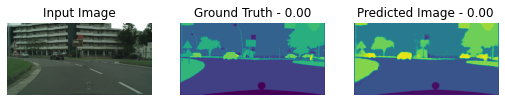

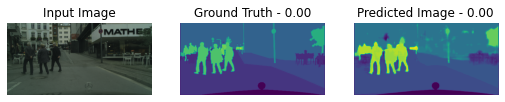

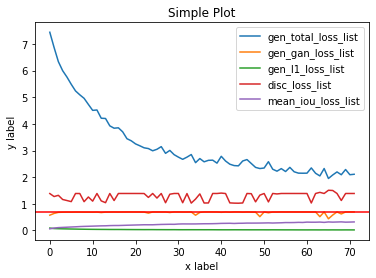

Epoch:  7
gen_total_loss: 1.9922735691070557
gen_gan_loss: 0.6930478811264038
disc_loss: 1.3862242698669434
l2_loss: 0
l1_loss_whole_epoch is 0.01754177361726761
mean_iou_loss: 0.32744497060775757
time 233.8954451084137


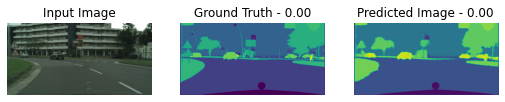

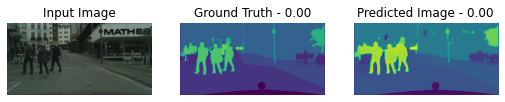

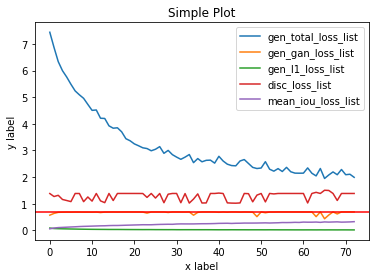

Epoch:  8
gen_total_loss: 2.093905448913574
gen_gan_loss: 0.6918948888778687
disc_loss: 1.3847326040267944
l2_loss: 0
l1_loss_whole_epoch is 0.01754605583846569
mean_iou_loss: 0.3287014365196228
time 234.08985567092896


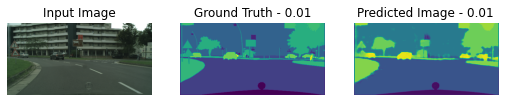

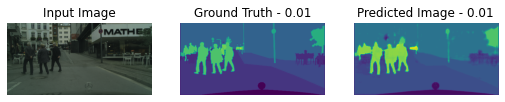

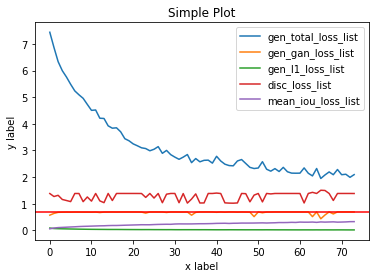

Epoch:  9
gen_total_loss: 2.044461727142334
gen_gan_loss: 0.6655982732772827
disc_loss: 1.2446880340576172
l2_loss: 0
l1_loss_whole_epoch is 0.01762939617037773
mean_iou_loss: 0.3260534107685089
time 234.77078413963318


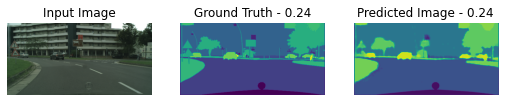

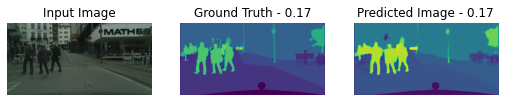

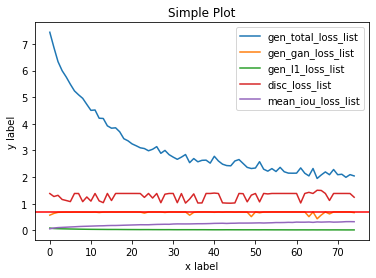

Epoch:  10
gen_total_loss: 2.0386321544647217
gen_gan_loss: 0.693139910697937
disc_loss: 1.3862890005111694
l2_loss: 0
l1_loss_whole_epoch is 0.018479367718100548
mean_iou_loss: 0.31478092074394226
time 234.15348839759827


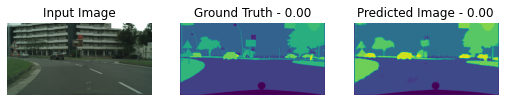

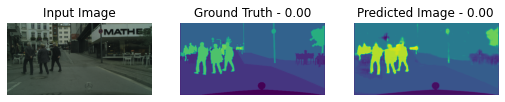

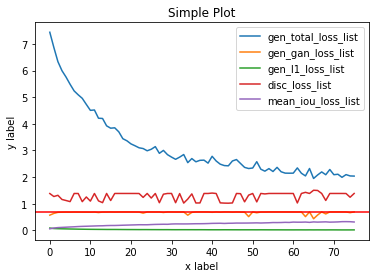

Epoch:  11
gen_total_loss: 1.9434621334075928
gen_gan_loss: 0.692737340927124
disc_loss: 1.3859833478927612
l2_loss: 0
l1_loss_whole_epoch is 0.017116189002990723
mean_iou_loss: 0.33924344182014465
time 231.80093359947205


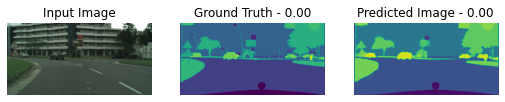

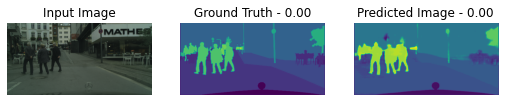

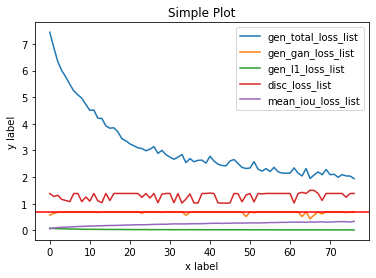

Epoch:  12
gen_total_loss: 1.9065072536468506
gen_gan_loss: 0.6927301287651062
disc_loss: 1.3838932514190674
l2_loss: 0
l1_loss_whole_epoch is 0.016719331964850426
mean_iou_loss: 0.34235939383506775
time 231.07593083381653


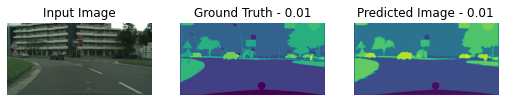

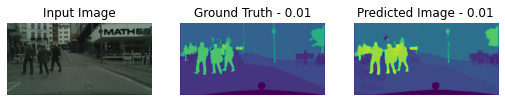

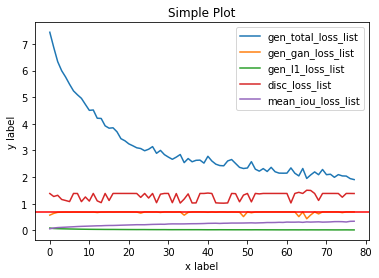

Epoch:  13
gen_total_loss: 1.925828218460083
gen_gan_loss: 0.6930153369903564
disc_loss: 1.3862874507904053
l2_loss: 0
l1_loss_whole_epoch is 0.01709757000207901
mean_iou_loss: 0.3387061655521393
time 236.93412494659424


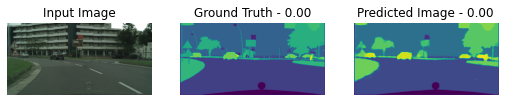

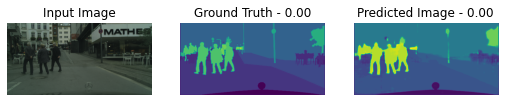

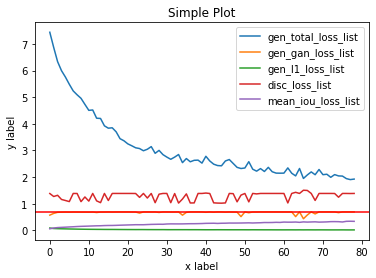

Epoch:  14
gen_total_loss: 2.0208449363708496
gen_gan_loss: 0.6930091381072998
disc_loss: 1.3862770795822144
l2_loss: 0
l1_loss_whole_epoch is 0.016602693125605583
mean_iou_loss: 0.34277477860450745
time 242.9983651638031


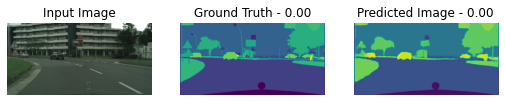

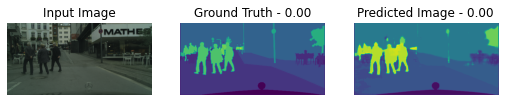

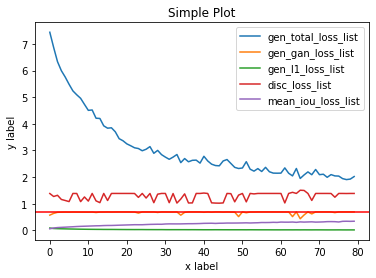

Epoch:  15
gen_total_loss: 1.9086551666259766
gen_gan_loss: 0.6929653286933899
disc_loss: 1.3862836360931396
l2_loss: 0
l1_loss_whole_epoch is 0.016474071890115738
mean_iou_loss: 0.344178169965744
time 236.5763566493988


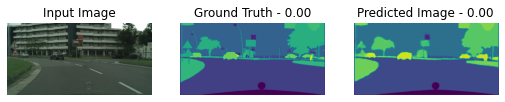

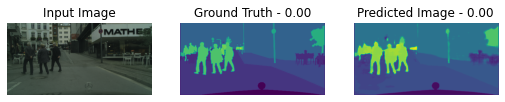

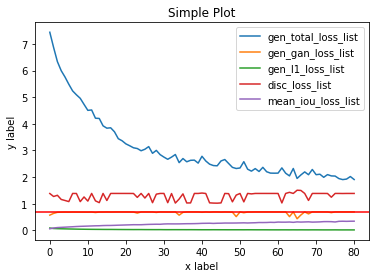

Epoch:  16
gen_total_loss: 1.9976423978805542
gen_gan_loss: 0.6929287910461426
disc_loss: 1.3862693309783936
l2_loss: 0
l1_loss_whole_epoch is 0.01683802716434002
mean_iou_loss: 0.34078487753868103
time 237.11162614822388


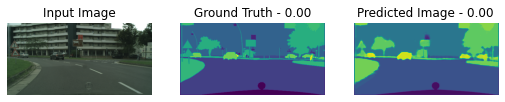

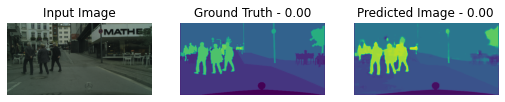

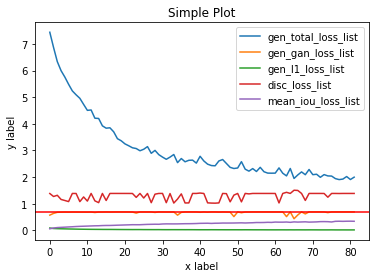

Epoch:  17
gen_total_loss: 1.8954194784164429
gen_gan_loss: 0.6928495168685913
disc_loss: 1.3862580060958862
l2_loss: 0
l1_loss_whole_epoch is 0.016438283026218414
mean_iou_loss: 0.34847375750541687
time 237.02692103385925


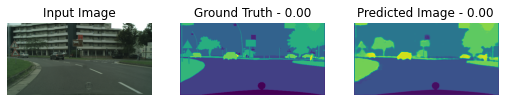

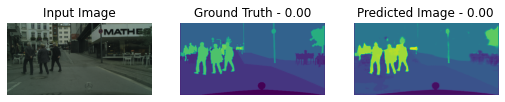

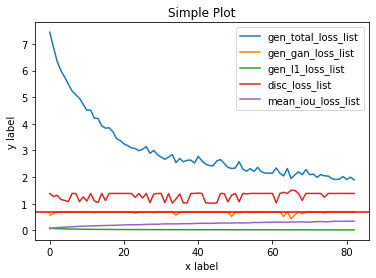

Epoch:  18
gen_total_loss: 1.8480653762817383
gen_gan_loss: 0.6927161812782288
disc_loss: 1.38624906539917
l2_loss: 0
l1_loss_whole_epoch is 0.015967946499586105
mean_iou_loss: 0.35469403862953186
time 236.376323223114


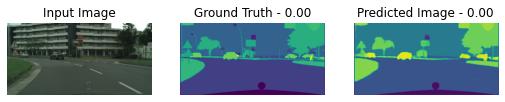

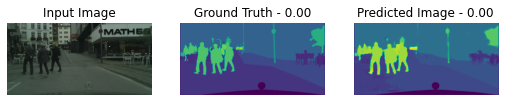

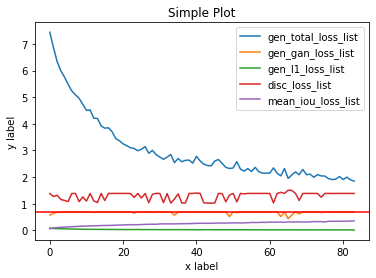

Epoch:  19
gen_total_loss: 2.091731071472168
gen_gan_loss: 0.6925049424171448
disc_loss: 1.3862154483795166
l2_loss: 0
l1_loss_whole_epoch is 0.01627228409051895
mean_iou_loss: 0.3514958620071411
time 237.30770182609558


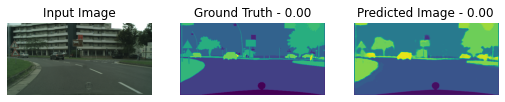

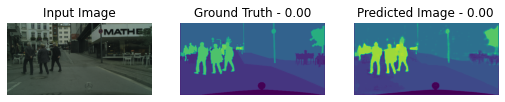

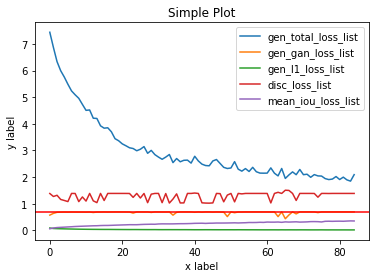

Epoch:  20
gen_total_loss: 1.9437930583953857
gen_gan_loss: 0.692095935344696
disc_loss: 1.3859550952911377
l2_loss: 0
l1_loss_whole_epoch is 0.016374440863728523
mean_iou_loss: 0.3494284451007843
time 237.58381366729736


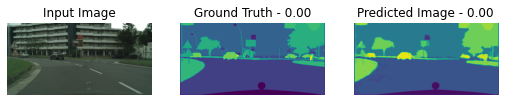

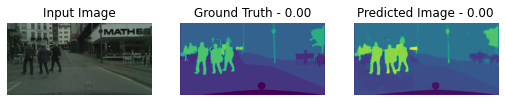

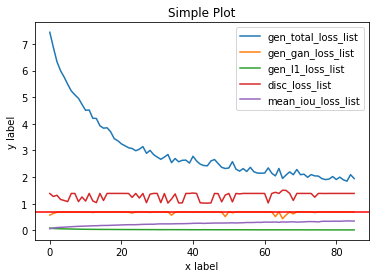

Epoch:  21
gen_total_loss: 1.9036321640014648
gen_gan_loss: 0.682862401008606
disc_loss: 1.379321813583374
l2_loss: 0
l1_loss_whole_epoch is 0.01606692001223564
mean_iou_loss: 0.3547428250312805
time 237.27689003944397


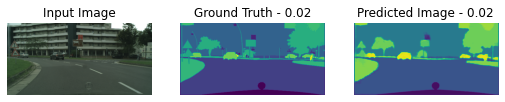

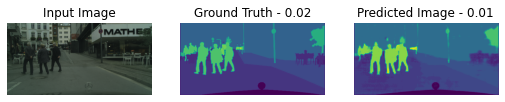

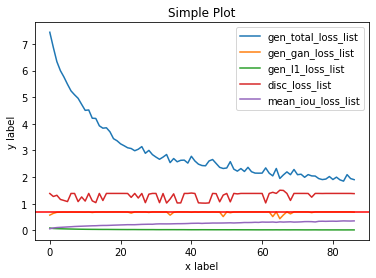

Epoch:  22
gen_total_loss: 2.085458278656006
gen_gan_loss: 0.6906390190124512
disc_loss: 1.388075828552246
l2_loss: 0
l1_loss_whole_epoch is 0.01700105145573616
mean_iou_loss: 0.343668133020401
time 236.2886106967926


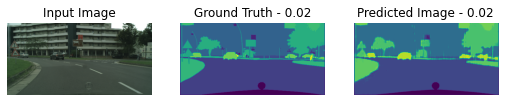

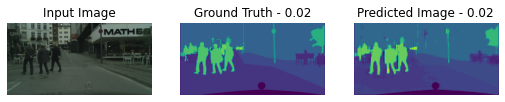

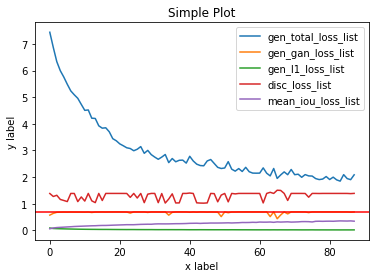

Epoch:  23
gen_total_loss: 1.9182188510894775
gen_gan_loss: 0.6929821372032166
disc_loss: 1.3862357139587402
l2_loss: 0
l1_loss_whole_epoch is 0.01602494716644287
mean_iou_loss: 0.3588781952857971
time 236.60463643074036


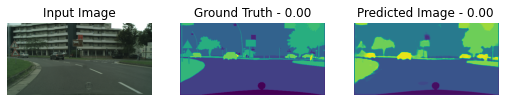

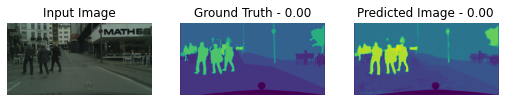

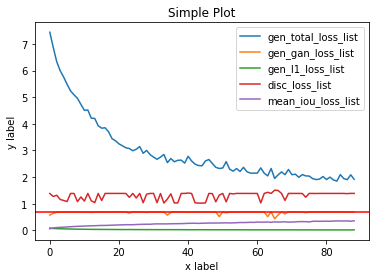

Epoch:  24
gen_total_loss: 1.843002200126648
gen_gan_loss: 0.692920446395874
disc_loss: 1.3841283321380615
l2_loss: 0
l1_loss_whole_epoch is 0.016354888677597046
mean_iou_loss: 0.35238978266716003
time 236.04385042190552


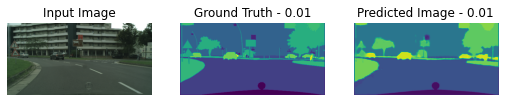

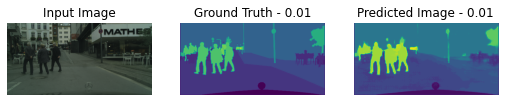

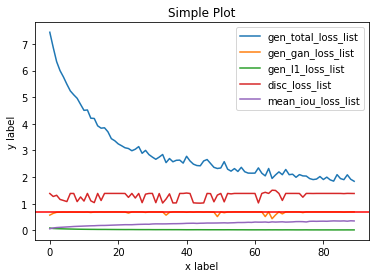

In [30]:
fit(train_data, 25, train_data)

In [31]:
generate_images(generator, train_data[19][0], train_data[19][1], 24  )

TypeError: 'int' object is not callable

In [32]:
generator.save(r'/kaggle/working/generator_improved.h5')


In [33]:
discriminator.save(r'/kaggle/working/disc_improved.h5')

# Вычисление метрика Жаккара
Вычисляется минимальные, среднее и маскимальные значения.

In [41]:
mean_iou1 = tf.keras.metrics.MeanIoU(num_classes=34)
mean_iou_avg = tf.keras.metrics.MeanIoU(num_classes=34)
accuracy = tf.keras.metrics.Accuracy()
min_iou = 100 
max_iou = -1

IOU_LIST = []

r = (TRAIN_SAMPLE + VAL_SAMPLE)//BATCH_SIZE
for i in range(r):
    print(i)
    input_image = train_data[i][0]
    target = train_data[i][1]
    
    gen_output = generator(input_image, training=False)
    
    
    target = (target + 1.0) * 16.5
    gen_output = (gen_output + 1.0) * 16.5
    
    target = tf.math.rint(target)
    gen_output = tf.math.rint(gen_output)
    
    for j in range(BATCH_SIZE):
        target1 = tf.reshape(target[j], [256*512])
        gen_output1 = tf.reshape(gen_output[j], [256*512])    
        
        
        a = mean_iou1.update_state(target1,gen_output1)
        c = mean_iou_avg.update_state(target1,gen_output1)
        b = accuracy.update_state(target1,gen_output1)
        IOU_LIST.append(mean_iou1.result())
        if mean_iou1.result() < min_iou:
            min_iou = mean_iou1.result()
            print(f"min_iou :{min_iou} at {i} {j} ")
        if mean_iou1.result() > max_iou:
            max_iou = mean_iou1.result()
            print(f"max_iou :{max_iou} at {i} {j} ")
        mean_iou1.reset_states()
        
print(mean_iou_avg.result())
print(accuracy.result())


0
min_iou :0.3138757646083832 at 0 0 
max_iou :0.3138757646083832 at 0 0 
max_iou :0.38957637548446655 at 0 1 
min_iou :0.30489471554756165 at 0 3 
min_iou :0.30404573678970337 at 0 7 
1
max_iou :0.3909955620765686 at 1 1 
max_iou :0.43752118945121765 at 1 3 
2
3
4
min_iou :0.2815949320793152 at 4 1 
min_iou :0.2516145706176758 at 4 2 
min_iou :0.25143253803253174 at 4 6 
5
min_iou :0.24370943009853363 at 5 2 
6
7
max_iou :0.44718441367149353 at 7 2 
8
9
10
max_iou :0.4757666289806366 at 10 7 
11
12
13
14
max_iou :0.5003184676170349 at 14 0 
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
min_iou :0.24358928203582764 at 44 6 
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
min_iou :0.23850339651107788 at 67 1 
68
69
70
71
72
73
min_iou :0.2254960685968399 at 73 1 
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
max_iou :0.5219453573226929 at 90 3 
max_iou :0.5241600275039673 at 90 7 
91
92
93
94
95
96
97
98
99
100
101
10

In [42]:
print(min_iou)
print(max_iou)

tf.Tensor(0.2012746, shape=(), dtype=float32)
tf.Tensor(0.5258333, shape=(), dtype=float32)


# Гистограмма распределения метрики Жаккара для изображений
Красная линия определяет среднее значение.

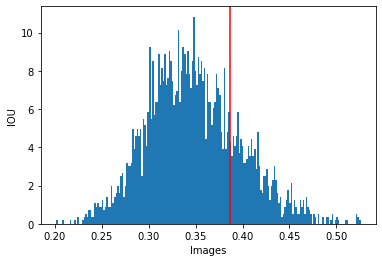

In [43]:
plt.hist(IOU_LIST, density=True, bins=200)  # `density=False` would make counts
plt.ylabel('IOU')
plt.xlabel('Images')
plt.axvline(x=0.3869428, color='r', linestyle='-')